In [2]:
%load_ext autoreload
%autoreload 2

import os
import numpy as np
from scipy.integrate import quad

from crc_scripts.io.gizmo import *
from crc_scripts import config
from crc_scripts.observations import dust_obs as obs
from crc_scripts.observations.obs_data import Observational_Data
import crc_scripts.utils.math_utils as math_utils
import crc_scripts.utils.snap_utils as snap_utils
import crc_scripts.utils.data_calc_utils as calc
import crc_scripts.utils.grain_size.grain_size_utils as grain_size_utils
from crc_scripts.figure import Figure,Projection
from crc_scripts.analysis.data_reduction import MultiSnapDataIO

import crc_scripts.analytical_models.grain_size_evo as gse_models

# First setup directory for all the plots
plot_dir = os.path.join(os.environ['SLATE'],'dust_size_evo/')
os.makedirs(plot_dir, exist_ok=True)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Load and Check Single Snapshot for Multiple Simulations

In [4]:
# Disk parameters
disk_radius = 13. # kpc ~2x the IC disk scale length
disk_scale_height = 0.5 # kpc ~2x the IC disk scale height

main_dirc = '/N/project/choban_group/cchoban/size_evo_suite'
main_dirc = '/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests'


# Snapshot to check
snap_num = 68

snap_dirs = [
             main_dirc+'/fiducial/output',
             main_dirc+'/10xVcoag/output',
             main_dirc+'/no_Ccoag/output',
             main_dirc+'/kolmogorov/output',
             main_dirc+'/kol_10xVcoag/output',
             main_dirc+'/kol_noCcoag/output',
             main_dirc+'/kol_noCcoag_10xVcoag/output',
             ]
# Shorthand names for each sim used in plot legends and file names
sim_names = [
             'fiducial_coag',
             '10xVcoag',
             'no_Ccoag_coag',
             'kol_coag',
             'kol_10xVcoag_coag',
             'kol_noCcoag_coag',
             'kol_noCcoag_10xVcoag_coag'
             ]

main_dirc = '/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_shat_only_tests'

snap_dirs = [
             main_dirc+'/fiducial/output',
             main_dirc+'/10xVcoag/output',
             main_dirc+'/no_Ccoag/output',
             main_dirc+'/kolmogorov/output',
             main_dirc+'/kol_10xVcoag/output',
             main_dirc+'/kol_noCcoag/output',
             main_dirc+'/kol_noCcoag_10xVcoag/output',
             ]
# Shorthand names for each sim used in plot legends and file names
sim_names = [
             'fiducial_coagshat',
             '10xVcoag_coagshat',
             'no_Ccoag_coagshat',
             'kol_coagshat',
             'kol_10xVcoag_coagshat',
             'kol_noCcoag_coagshat',
             'kol_noCcoag_10xVcoag_coagshat'
             ]



halos = []


for i,snap_dir in enumerate(snap_dirs):
    print("Snap Dirc: ",snap_dir)

    
    sp = load_snap(snap_dir, snap_num, cosmological=0)
    print("Snap Time:",sp.time)
    
    print(sp.time,sp.npart)
    print('total new star+gas particles',sp.npart[0]+sp.npart[4]) 
    G=sp.loadpart(0)
    print('gas')
    gas_mass = G.get_property('mass')
    print('gas mass', np.sum(gas_mass)/1E10)
    print('max min and median gas mass',np.max(gas_mass), np.min(gas_mass), np.median(gas_mass))
    dust_mass = G.get_property('M_dust')
    H2_mass = G.get_property('M_H2')
    print('dust_mass', np.sum(dust_mass)/1E10)
    print('H2 mass', np.sum(H2_mass)/1E10)
    HII_delaytime = G.get_property('HII_delaytime')
    print('HII mass', np.sum(gas_mass[HII_delaytime!=0])/1E10)
    HII_mass = G.get_property('M_gas_ionized')
    print('Ionized gas mass', np.sum(HII_mass)/1E10)
    Z = G.get_property('Z')
    print('median Z',np.median(Z), math_utils.weighted_percentile(Z, weights=gas_mass, ignore_invalid=True))
    print('stars')
    if(sp.npart[4] > 0):
        S=sp.loadpart(4)
        new_star_mass = S.get_property('mass')
        print('new star mass', np.sum(new_star_mass)/1E10)
        print("Max/Min/Median star mass:", np.max(new_star_mass), np.min(new_star_mass), np.median(new_star_mass))
    else: new_star_mass=0
    S_IC1 = sp.loadpart(2)
    S_IC2 = sp.loadpart(3)
    star_IC1_mass = S_IC1.get_property('mass')
    star_IC2_mass = S_IC2.get_property('mass')
    star_IC1_age = S_IC1.get_property('age')
    star_IC2_age = S_IC2.get_property('age')
    print('star IC1 mass', np.sum(star_IC1_mass)/1E10)
    print('star IC2 mass', np.sum(star_IC2_mass)/1E10)
    print('star IC1 age', np.median(star_IC1_age))
    print('star IC2 age', np.median(star_IC2_age))


        
    print("star+gas mass",(np.sum(new_star_mass) + np.sum(gas_mass) + np.sum(star_IC1_mass) + np.sum(star_IC2_mass))/1E10)


    halo = sp.loadhalo(mode=None)
    halo.set_disk(rmax = disk_radius, height=disk_scale_height)
    halo.set_orientation(ptype=4, mass_radius_max = 10, velocity_radius_max=10, radius_max=10, age_limits=[0,0.5])
    halos += [halo]

Snap Dirc:  /N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/fiducial/output
Snap Time: 0.6500000000000004
0.6500000000000004 [ 937787 2110000 1320000  422000  334718       1]
total new star+gas particles 1272505
gas
gas mass 0.7125881856
max min and median gas mass 21326.793 7086.614 7237.551
dust_mass 0.0012273916
H2 mass 0.0085297984
HII mass 0.0879615744
Ionized gas mass 0.2656297472
median Z 1.0028315 [1.02147465 0.9079703  1.39556261]
stars
new star mass 0.2184852224
Max/Min/Median star mass: 21143.633 5047.3267 6158.9873
star IC1 mass 4.6762909696
star IC2 mass 1.4926336
star IC1 age 7.713833
star IC2 age 7.707878
star+gas mass 7.099998208
Centering galaxy on median position of gas particles with nH>10 cm^-3.
assigning center of galaxy:
  center position [kpc] = -0.063, 0.032, -0.034
  center velocity [km/s] = 3.0, 3.8, -0.6
assigning principal axes:
  using ptype 4 particles at radius < 10 kpc
  using ptype 4 particles with age = [0, 0.5] Gyr
  axis ratio

#### Quick Check of Global Galaxy Properties

In [ ]:
ISM_phases = ['cold','warm','hot','coronal']

for i,halo in enumerate(halos):
    name = sim_names[i]

    print(name)
    G=halo.loadpart(0)
    S=halo.loadpart(4)

    gas_mass = G.get_property('mass')
    H2_mass = G.get_property('M_H2')
    dust_mass = G.get_property('M_dust')
    spec_mass = G.get_property('M_spec')
    DZ = G.get_property('D/Z')

    print('gas mass', np.sum(gas_mass)/1E10)
    print('H2 mass', np.sum(H2_mass)/1E10)
    print('dust mass', np.sum(dust_mass)/1E10)
    print('spec mass', np.sum(spec_mass,axis=0)/1E10)
    print('median D/Z', np.median(DZ))

    for i,phase in enumerate(ISM_phases):
        mask = calc.get_particle_mask(0, sp, mask_criteria=phase)
        print(phase,"phase gas mass:",np.sum(gas_mass[mask])/1E10)

    mach_num = G.get_property('mach_number')
    temp = G.get_property('temperature')
    T_clumping_factor = G.get_property('T_clumping_factor')
    Tcut = 1000
    T_cutoff = temp <= Tcut
    print("For Tcut = ", Tcut)
    print("T<Tcut gas mass:",np.sum(gas_mass[T_cutoff])/1E10)
    T_cutoff = temp*T_clumping_factor <= Tcut
    print("T<Tcut*T_clump gas mass:",np.sum(gas_mass[T_cutoff])/1E10)

    Tcut = 300
    T_cutoff = temp <= Tcut
    print("For Tcut = ", Tcut)
    print("T<Tcut gas mass:",np.sum(gas_mass[T_cutoff])/1E10)
    T_cutoff = temp*T_clumping_factor <= Tcut
    print("T<Tcut*T_clump gas mass:",np.sum(gas_mass[T_cutoff])/1E10)
        

#### Snapshot Projections

/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/fiducial/output
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/10xVcoag/output
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/no_Ccoag/output
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/kolmogorov/output
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/kol_10xVcoag/output
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/kol_noCcoag/output
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/kol_noCcoag_10xVcoag/output


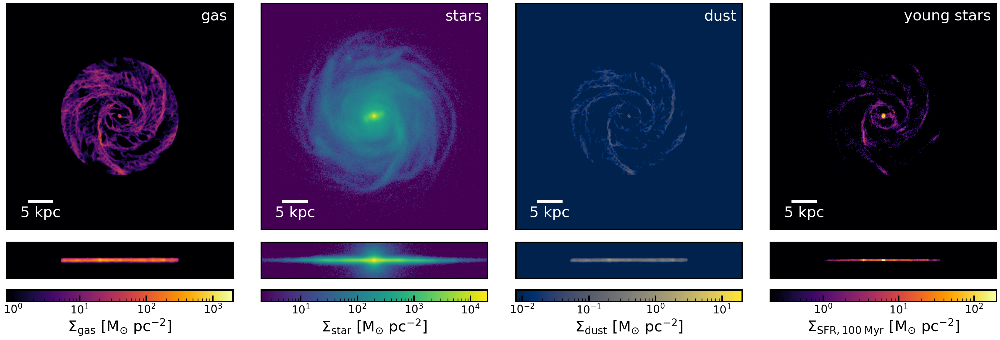

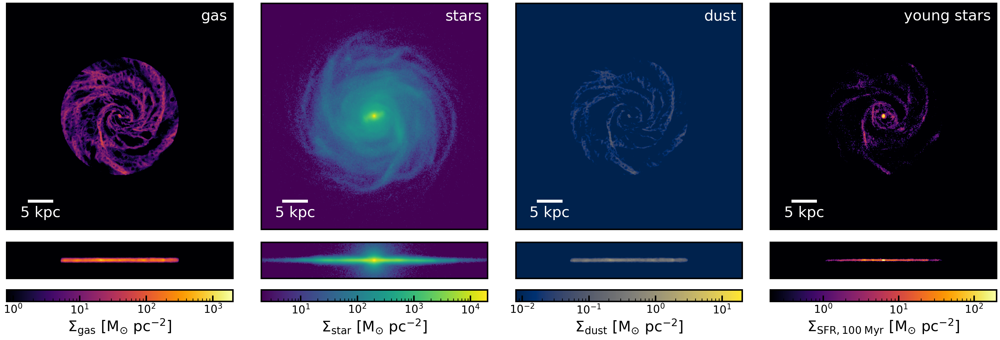

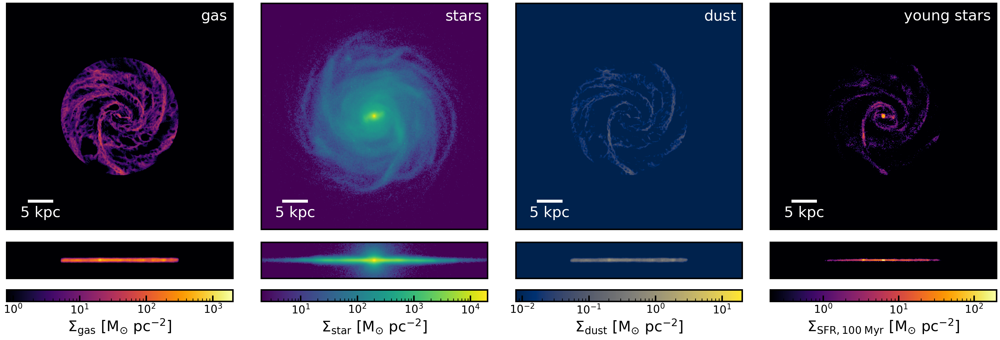

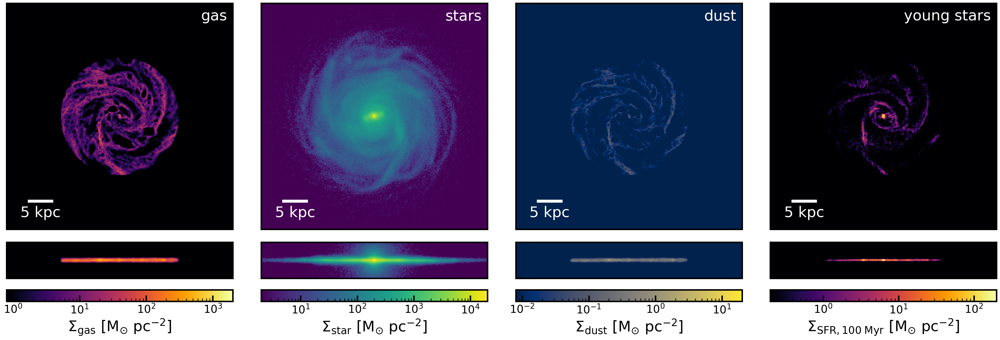

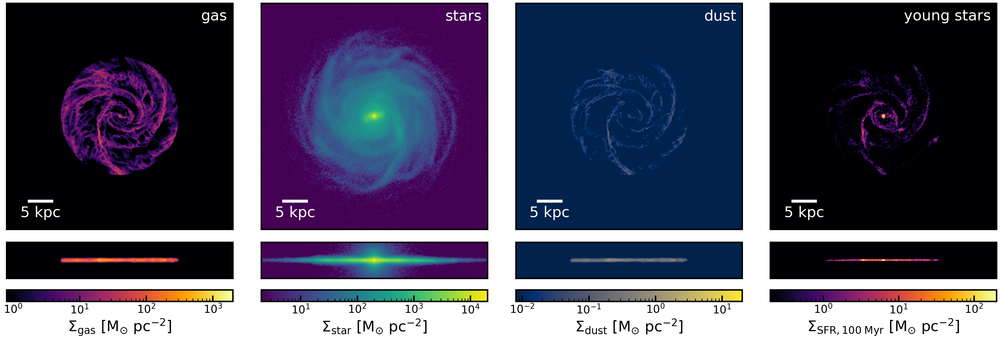

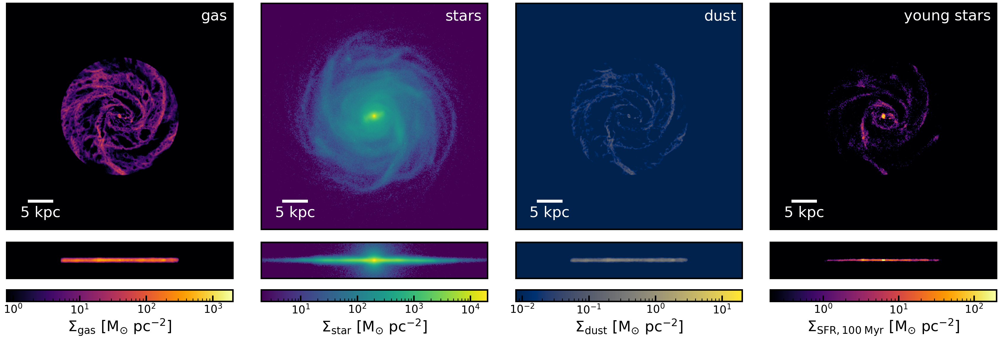

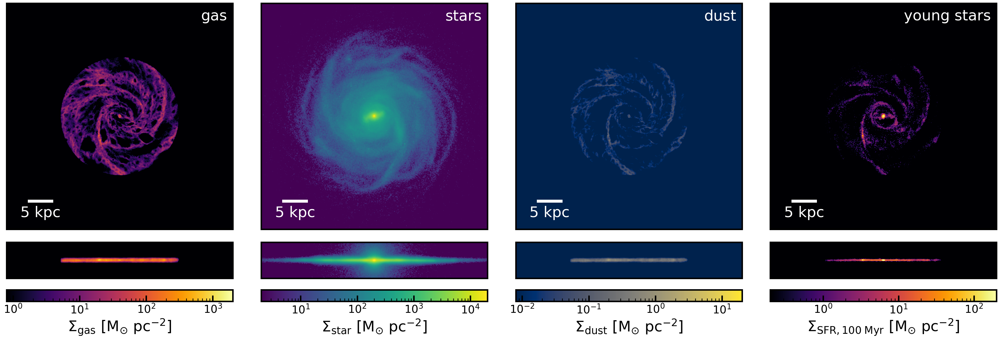

In [7]:

foutname = 'snapshot_projections.pdf'

# Physical size of projection 
proj_L = 15 # kpc
# Size resolution (kpc) for each "pixel" in projection
pixel_res=0.1
# Properties to plot projections of. Can be surface densities (total mass in pixel divided by pixel size) or properties like T (median value of all particles in pixel)
properties = ['sigma_gas','sigma_star','sigma_dust','sigma_sfr_100Myr']
# Limits for projection of each property. Defaults if not set
prop_limits = [[8E-1,2E3],[2E0,2E4],[8E-3,2E1],[2E-1,2E2]]
# Colormaps for each projection
prop_cmaps = ['inferno','viridis','cividis','inferno']
# Do you want log colormaps for each property (default = True)
log_cmaps = [True]*len(properties)
# Labels for each projection is so desired
labels = ['gas','stars','dust','young stars']
# Physical size of projection 
proj_L = 50 # kpc
# Do you want a secondary projection from an orthogonal axis (i.e. edge-on)
sub_proj = True
# size of secondary projection
sub_L = 8 # kpc



for i,halo in enumerate(halos):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]
    # Initialize projection figure
    L = proj_L
    height_ratios = [L/sub_L,1]
    new_proj = Projection(len(properties), add_sub_proj=sub_proj, add_colorbars=True, height_ratios=height_ratios)
    # Create projections for each property and plot the projection
    for j,prop in enumerate(properties):
        new_proj.set_proj_axis(j, prop, L, axes_visible=False)
        # Create x-y projection using a 2D histogram
        main_pixel_stats, main_xedges, main_yedges, main_extent = calc.calc_projected_prop(prop, halo, [L,L,L], pixel_res=pixel_res, proj='xy')
        if sub_proj:
            # Create x-z subprojection using a 2D histogram
            sub_pixel_stats, sub_xedges, sub_yedges, sub_extent = calc.calc_projected_prop(prop, halo, [L,sub_L,L], pixel_res=pixel_res, proj='xz')
        else:
            sub_pixel_stats=None; sub_extent=None
        # x-z projection
        # Create the projection
        if labels is not None:
            label = labels[j]
        else:
            label=None
        new_proj.plot_projection(j, main_pixel_stats, main_extent, sub_proj_data=sub_pixel_stats, sub_extent=sub_extent,
                                    cmap= prop_cmaps[j], v_limits = prop_limits[j],v_log=log_cmaps[j], label=label)
        
    new_proj.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)

#### Comparing gas phase diagram when accounting for clumping factor.

/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/fiducial/output


/N/slate/cchoban/codes/crc_scripts/src/crc_scripts/io/particle.py:569: RuntimeWarning: divide by zero encountered in divide
  f_dense = 1/2 + 1/2 * erf((sigma_squared/2-s_dense)/np.sqrt(2*sigma_squared))


/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/10xVcoag/output


/N/slate/cchoban/codes/crc_scripts/src/crc_scripts/io/particle.py:569: RuntimeWarning: divide by zero encountered in divide
  f_dense = 1/2 + 1/2 * erf((sigma_squared/2-s_dense)/np.sqrt(2*sigma_squared))


/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/no_Ccoag/output


/N/slate/cchoban/codes/crc_scripts/src/crc_scripts/io/particle.py:569: RuntimeWarning: divide by zero encountered in divide
  f_dense = 1/2 + 1/2 * erf((sigma_squared/2-s_dense)/np.sqrt(2*sigma_squared))


/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/kolmogorov/output


/N/slate/cchoban/codes/crc_scripts/src/crc_scripts/io/particle.py:569: RuntimeWarning: divide by zero encountered in divide
  f_dense = 1/2 + 1/2 * erf((sigma_squared/2-s_dense)/np.sqrt(2*sigma_squared))


/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/kol_10xVcoag/output


/N/slate/cchoban/codes/crc_scripts/src/crc_scripts/io/particle.py:569: RuntimeWarning: divide by zero encountered in divide
  f_dense = 1/2 + 1/2 * erf((sigma_squared/2-s_dense)/np.sqrt(2*sigma_squared))


/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/kol_noCcoag/output


/N/slate/cchoban/codes/crc_scripts/src/crc_scripts/io/particle.py:569: RuntimeWarning: divide by zero encountered in divide
  f_dense = 1/2 + 1/2 * erf((sigma_squared/2-s_dense)/np.sqrt(2*sigma_squared))


/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/kol_noCcoag_10xVcoag/output


/N/slate/cchoban/codes/crc_scripts/src/crc_scripts/io/particle.py:569: RuntimeWarning: divide by zero encountered in divide
  f_dense = 1/2 + 1/2 * erf((sigma_squared/2-s_dense)/np.sqrt(2*sigma_squared))


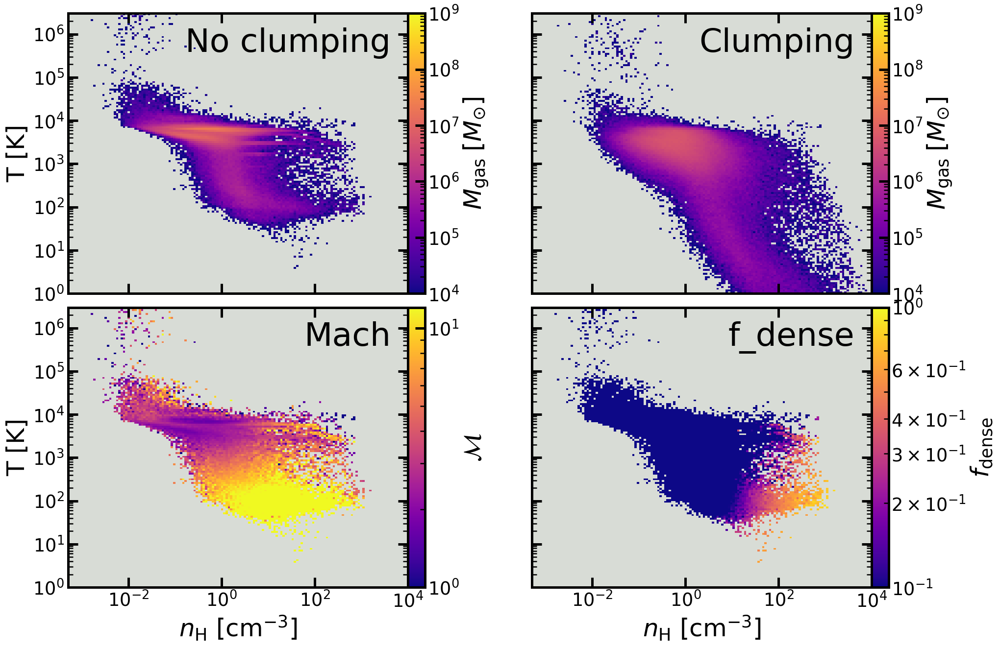

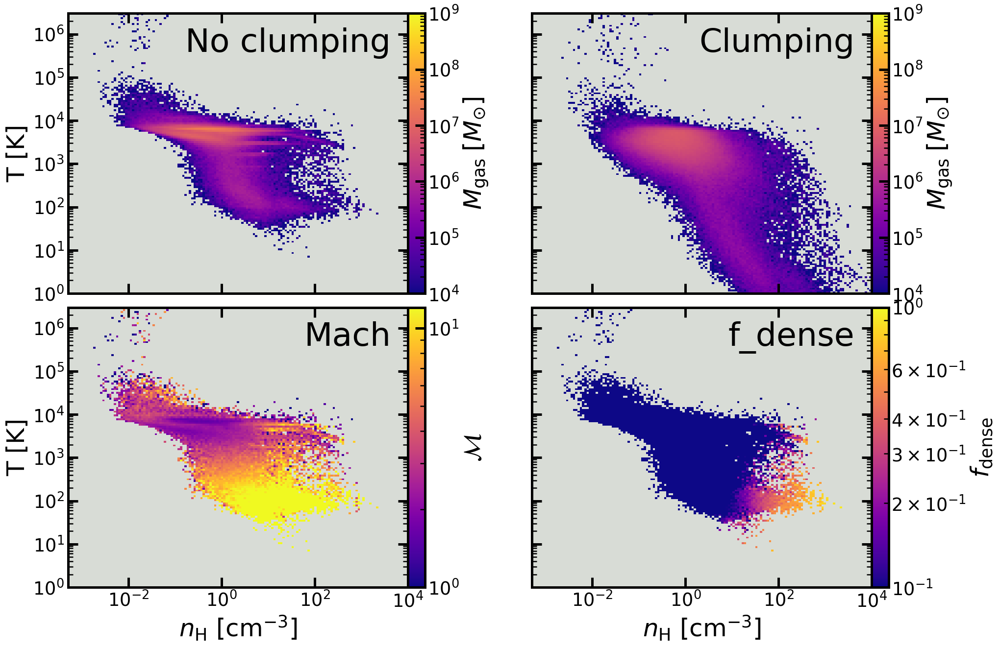

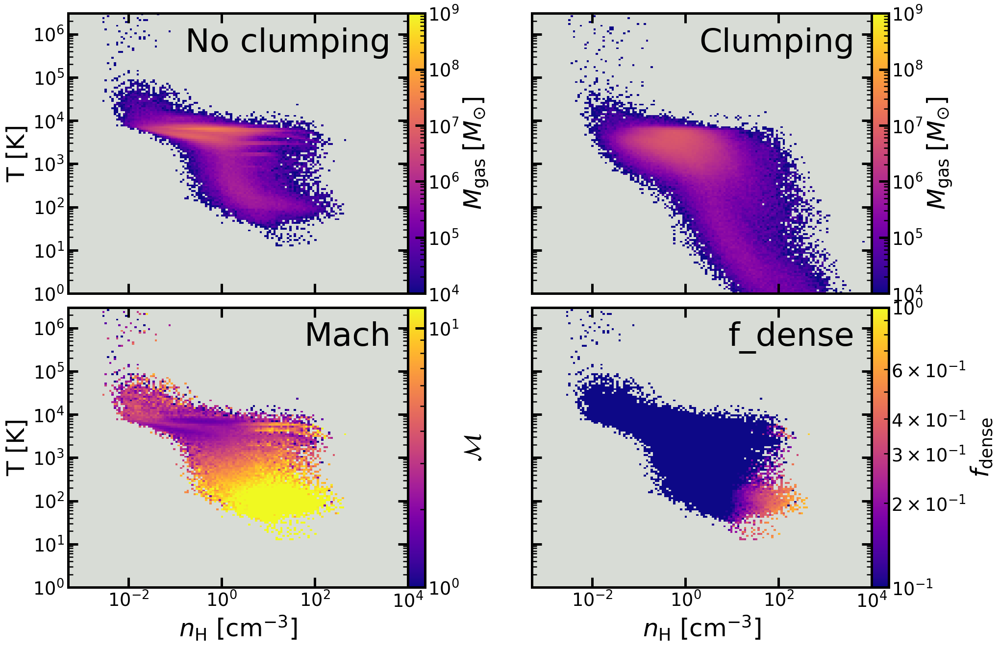

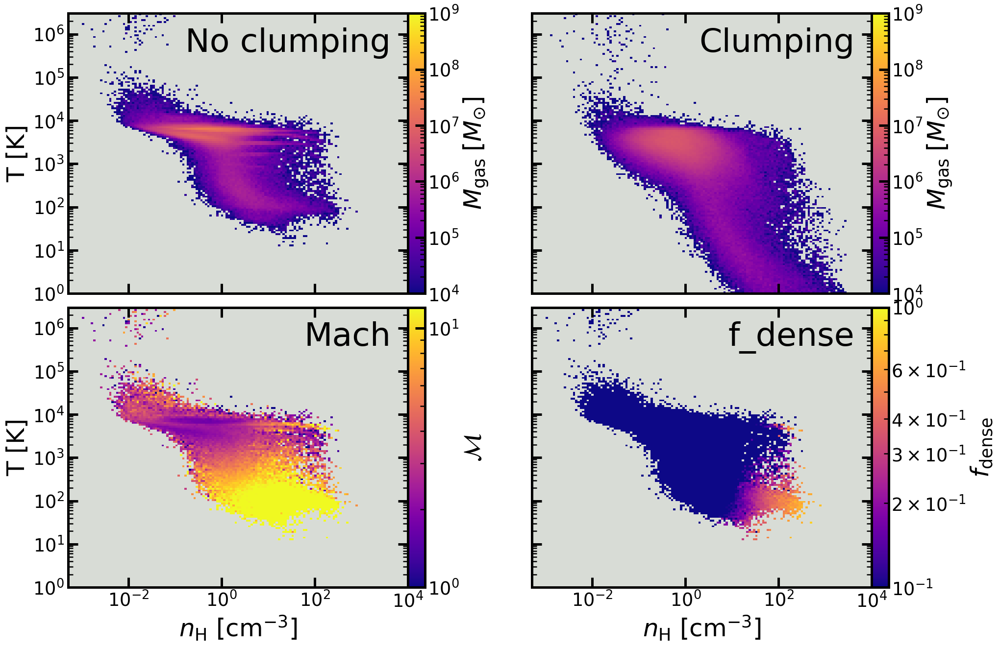

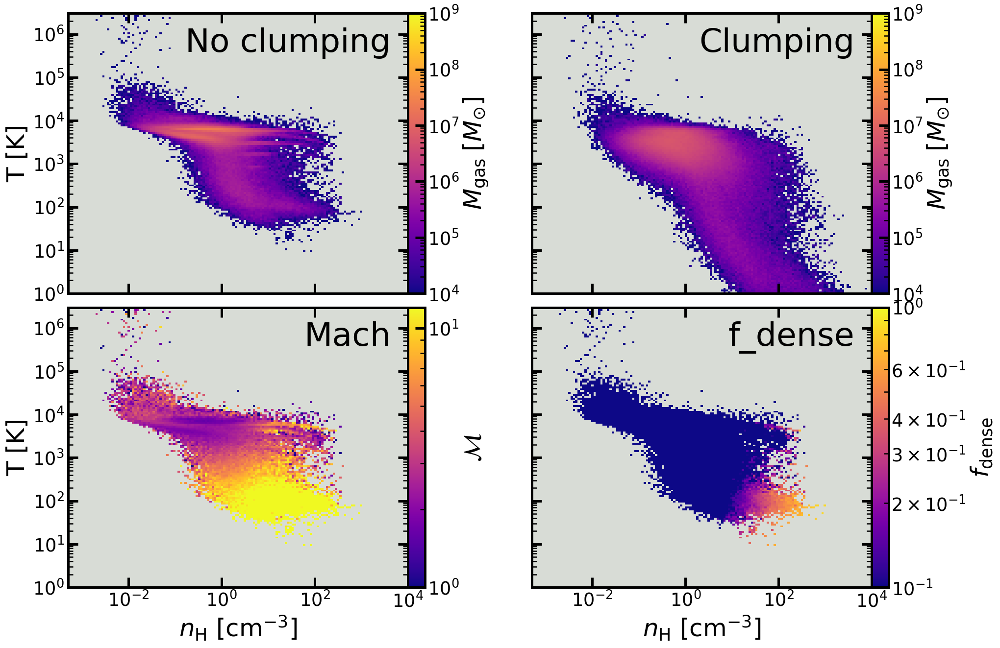

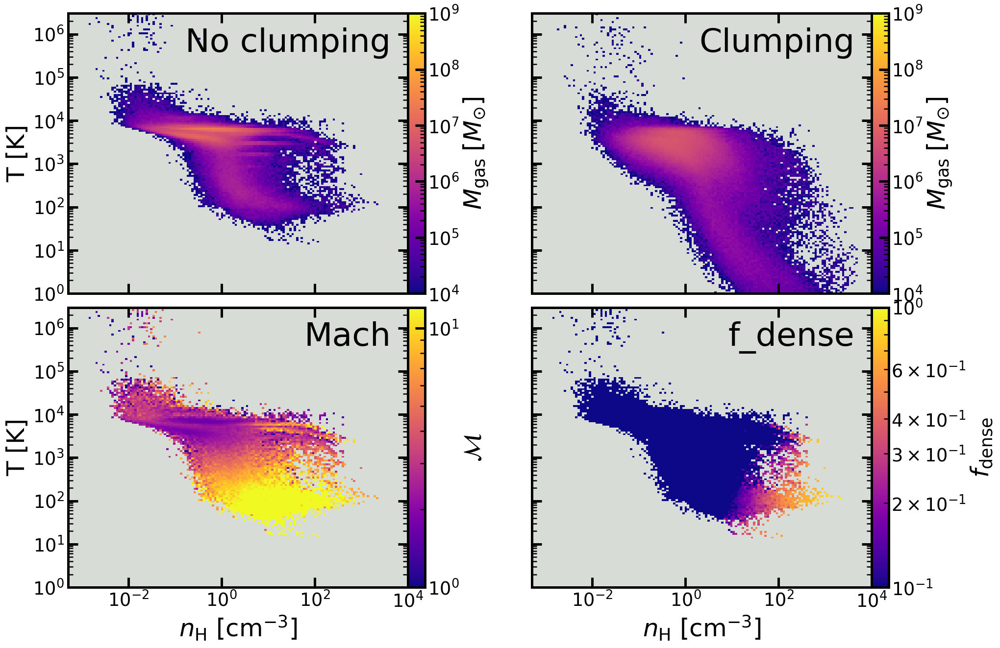

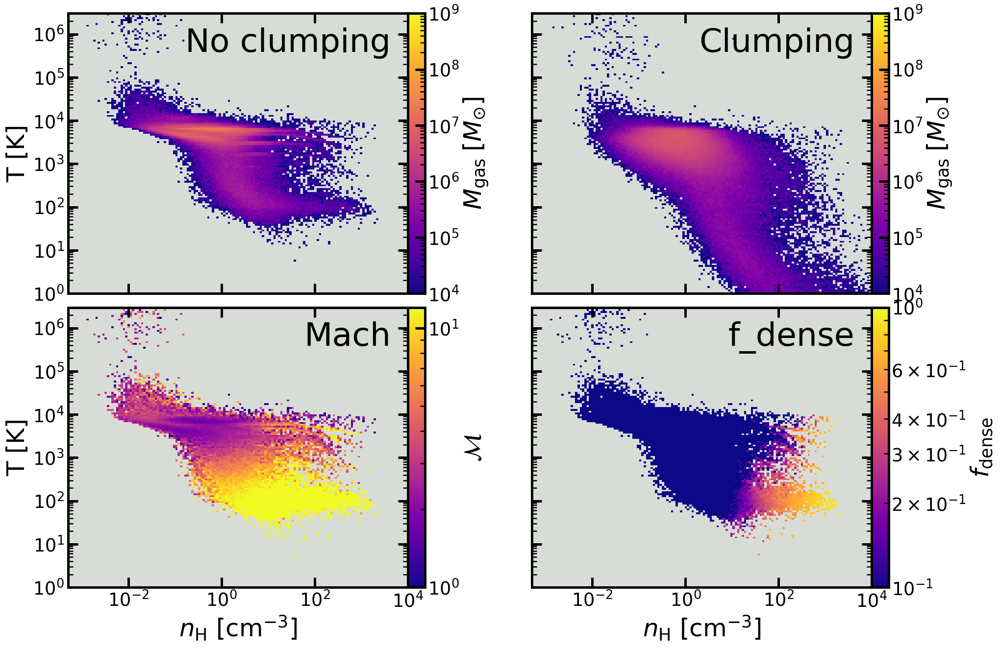

In [5]:
foutname = 'clumping_factor_phase_diagram.pdf'
prop = 'M_gas'
z_logs=[True]
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-4,1E4]
T_lims = [1,3E6]

prop_lims=[[1E4,1E9],[1E4,1E9],[1,12],[0.1,1]]


for i,halo in enumerate(halos):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    fig = Figure(4,ncols=2, sharey=True, sharex=True)

    # Set up for each plot
    fig.set_axis(0, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
    ret = calc.calc_phase_hist_data(prop, halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, factor_clumping=False)
    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(0, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[0], z_log=z_logs[0],label='No clumping')

    # Add colorbar to last axis
    fig.add_colorbar(0,cbar_prop=prop)


    # Set up for each plot
    fig.set_axis(1, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
    ret = calc.calc_phase_hist_data(prop, halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, factor_clumping=True)
    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(1, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[1], z_log=z_logs[0],label='Clumping')

    # Add colorbar to last axis
    fig.add_colorbar(1,cbar_prop=prop)

        # Set up for each plot
    fig.set_axis(2, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
    ret = calc.calc_phase_hist_data('mach_number', halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, factor_clumping=False)
    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(2, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[2], z_log=z_logs[0],label='Mach')

    # Add colorbar to last axis
    fig.add_colorbar(2,cbar_prop='mach_number')

    # Set up for each plot
    fig.set_axis(3, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
    ret = calc.calc_phase_hist_data('f_dense', halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, factor_clumping=False)
    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(3, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[3], z_log=z_logs[0],label='f_dense')

    # Add colorbar to last axis
    fig.add_colorbar(3,cbar_prop='f_dense')



    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)

#### Dust Process Rates Phase Diagram

In [ ]:
foutname = 'dMdt_phase_diagram.pdf'
props = ['dMdt_acc','dMdt_acc','dMdt_sput', 'dMdt_pd']
fig_labels = ['accretion \n T<300K','accretion \n T<1000K','sputtering','photodestruction']
z_logs=[True]*len(props)
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lims=[[1E-7,1E-4],[1E-7,1E-4],[1E-8,1E-6],[1E-7,1E-4]]

# Number of subsampling for each bin when calculating dMdt rates.
# N=1 will assume all grains have the same size in each bin
# Set to a small number to get a good estimate
bin_subsamples = 4



for i,halo in enumerate(halos):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    G = halo.loadpart(0)
    #dMdt_shat, dMdt_coag = grain_size_utils.get_dust_shattering_and_coagulation_rate(G)

    dMdt_acc1 = grain_size_utils.get_dust_accretion_rate(G, T_cutoff=300, factor_clumping=True,bin_subsamples=bin_subsamples)
    print('dMdt_acc:',np.sum(dMdt_acc1),'Msol/yr')
    dMdt_acc2 = grain_size_utils.get_dust_accretion_rate(G, T_cutoff=1000, factor_clumping=True,bin_subsamples=bin_subsamples)
    print('dMdt_acc:',np.sum(dMdt_acc2),'Msol/yr')
    dMdt_sput = grain_size_utils.get_dust_sputtering_rate(G, T_cutoff = 1E4, factor_clumping=True,bin_subsamples=bin_subsamples)
    print('dMdt_sput:',np.sum(dMdt_sput),'Msol/yr')
    dMdt_pd = grain_size_utils.get_photodestruction_rate(G,max_grain_size=5E-3,scaling_factor=1.0, bin_subsamples=1)
    print('dMdt_pd:',np.sum(dMdt_pd),'Msol/yr')

    dMdt=[dMdt_acc1,dMdt_acc2,-dMdt_sput,-dMdt_pd]


    fig = Figure(len(props),ncols=2, sharex='col',sharey='row')

    for j,prop in enumerate(props):
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        ret = calc.calc_phase_hist_data(dMdt[j], halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[j],label=fig_labels[j])

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='dMdt')

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)

In [ ]:
foutname = 'Mshatcoag_phase_diagram.pdf'
props = ['dM_coag','dM_shat']
fig_labels = ['shattering','coagulation']
z_logs=[True]*len(props)
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lims=[[1E-7,1E-4]]*len(props)

a_small = 0.01 

for i,sp in enumerate(snaps):
    if i!=0: continue
    print(sp.sdir)
    name = sim_names[i]

    G = sp.loadpart(0)
    a_centers = sp.Grain_Bin_Centers
    total_dust_mass = np.sum(G.get_property('M_dust'))
    # Determine how much dust mass is can shatter or coagulate for each gas particle
    
    shat_dMbin_dt, coag_dMbin_dt = grain_size_utils.get_dust_shattering_and_coagulation_rate(
                             G, 
                             scaling_factor=1.0,
                             factor_clumping=True,)

    dMdt = [shat_dMbin_dt, coag_dMbin_dt]

    print(np.sum(shat_dMbin_dt,axis=1), np.sum(coag_dMbin_dt,axis=1))

    fig = Figure(len(props),ncols=2, sharex='col',sharey='row')

    j=0
    fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

    dMbin_dt = dMdt[j]
    dMbin_total = np.sum(dMbin_dt[:,a_centers<a_small],axis=1)

    ret = calc.calc_phase_hist_data(dMbin_total, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

    ret.statistic[ret.statistic == 0] = np.nan

    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[j],label=fig_labels[j])

    # Add colorbar to last axis
    fig.add_colorbar(j,cbar_prop='dMdt')


    j=1
    fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

    dMbin_dt = dMdt[j]
    dMbin_total = np.sum(dMbin_dt[:,a_centers<a_small],axis=1)

    ret = calc.calc_phase_hist_data(dMbin_total, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')
    ret.statistic = np.abs(ret.statistic)  
    ret.statistic[ret.statistic == 0] = np.nan

    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[j],label=fig_labels[j])

    # Add colorbar to last axis
    fig.add_colorbar(j,cbar_prop='dMdt')

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)


##### Shattering and Coagulation Mass Rates for each Bin

In [46]:
foutname = 'Mshatcoag_phase_diagram.pdf'
props = ['M_dust','M_dust']
fig_labels = ['shattering','coagulation']
z_logs=[True]*len(props)
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lims=[[1E2,1E6]]*len(props)



for i,halo in enumerate(halos):
    sp=halo.sp
    print(sp.sdir)
    name = sim_names[i]

    G = halo.loadpart(0)
    total_dust_mass = np.sum(G.get_property('M_dust'))
    # Determine how much dust mass is can shatter or coagulate for each gas particle
    
    Mshat, Mcoag = grain_size_utils.get_mass_of_dust_that_can_shatter_or_coagulate(G)
    Mdust = [Mshat, Mcoag]
    print(Mshat/total_dust_mass,Mcoag/total_dust_mass)

    fig = Figure(len(props),ncols=2, sharex='col',sharey='row')

    for j,prop in enumerate(props):
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        ret = calc.calc_phase_hist_data(Mdust[j], halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[j],label=fig_labels[j])

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='M_dust')

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)

/N/project/choban_group/cchoban/size_evo_suite/MW_ShatCoag_Only/output


KeyboardInterrupt: 

#### Grain Velocity for Each Bin

In [ ]:
foutname = 'Kolmogorov_vgrain_phase_diagram.pdf'
props = ['v_grain']
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lim=[1E-2,1E1]

dense_gas_enhancement=True

for i,sp in enumerate(snaps):
    print(sp.sdir)
    name = sim_names[i]

    gas = sp.loadpart(0)
    nH = gas.get_property('nH')
    rho = gas.get_property('density')
    temp = gas.get_property('temperature')
    M = gas.get_property('mach_number')
    
    rho_c = 3.1
    b = 0.5
    nH_rms =np.sqrt(1+b*b*M*M)*nH
    if dense_gas_enhancement:
        nH_rms[(temp<=1000) & (nH >= 1)] *= 1000

    spec_props = config.dust_species_properties('silicates')
    rho_c = spec_props['rho_c'] # Bulk density of silicates [g/cm^3]
    poisson = spec_props['poisson'] # Poisson ratio
    youngs = spec_props['youngs'] # Young's modulus [GPa]
    gamma = spec_props['gamma'] # Surface energy [J/m^2]
    v_shat = spec_props['v_shat']*1E-5 # Shattering velocity [km/s]

    bin_num = sp.Flag_GrainSizeBins
    a_centers = sp.Grain_Bin_Centers

    fig = Figure(bin_num,ncols=4, sharex='col',sharey='row')

    for j in range(bin_num):
        agrain = a_centers[j]
        a_collider=agrain
        vgr = 0.32 * (M/3) * np.power(agrain,0.5) * np.power(temp/100,0.25) * \
        np.power(nH_rms/1E3,-0.25)*np.power(rho_c/3.5,0.5) # km/s

        vcoag = gse_models.v_coagulation(agrain*config.um_to_cm,a_collider*config.um_to_cm,
                        rho_c,poisson,youngs,gamma,fudge_factor=True) * 1E-5 # cm/s to km/s

        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        ret = calc.calc_phase_hist_data(vgr, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='median')

        M_gas = gas.get_property('mass')
        M_gas[vgr>vcoag] = 0
        mass_coag = calc.calc_phase_hist_data(M_gas, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum').statistic
        
        vgr_coag = ret.statistic.T
        vgr_coag[vgr_coag>vcoag] = np.nan
        print('a_grain: %2.2g'%agrain,'v_coag: %2.2g'%vcoag,'fraction of gas < v_coag: %2.2g'%(np.nansum(mass_coag)/np.sum(gas.get_property('mass'))))


        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, vgr_coag, cmap=cmap, z_lim=prop_lim, z_log=z_log,label=r'$a=%1.1g\,\mu m$'%agrain+'\n'+r'$v_{\rm coag}=%2.1g$ km/s'%vcoag)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_label=r'$v_{\rm gr}$ [km/s]')
    
    fig.save(plot_dir+name+'_'+str(sp.snum)+'_vcoag_'+foutname)


    fig = Figure(bin_num,ncols=4, sharex='col',sharey='row')

    for j in range(bin_num):
        agrain = a_centers[j]
        a_collider=agrain
        vgr = 0.32 * (M/3) * np.power(agrain,0.5) * np.power(temp/100,0.25) * \
        np.power(nH_rms/1E3,-0.25)*np.power(rho_c/3.5,0.5) # km/s
        
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        ret = calc.calc_phase_hist_data(vgr, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='median')
        
        M_gas = gas.get_property('mass')
        M_gas[vgr<v_shat] = 0
        mass_shat = calc.calc_phase_hist_data(M_gas, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum').statistic

        vgr_shat = ret.statistic.T
        vgr_shat[vgr_shat<v_shat] = np.nan
        print('a_grain: %2.2g'%agrain,'v_shat: %2.2g'%v_shat,'fraction of gas > v_shat: %2.2g'%(np.nansum(mass_shat)/np.sum(gas.get_property('mass'))))


        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, vgr_shat, cmap=cmap, z_lim=prop_lim, z_log=z_log,label=r'$a=%1.1g\,\mu m$'%agrain+'\n'+r'$v_{\rm shat}=%2.1g$ km/s'%v_shat)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_label=r'$v_{\rm gr}$ [km/s]')
    
    fig.save(plot_dir+name+'_'+str(sp.snum)+'_vshat_'+foutname)
        

In [ ]:
foutname = 'supersonic_vgrain_phase_diagram.pdf'
props = ['v_grain']
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lim=[1E-2,1E1]

dense_gas_enhancement=1
vcoag_enhancenent = 100

for i,sp in enumerate(snaps):
    print(sp.sdir)
    name = sim_names[i]

    gas = sp.loadpart(0)
    nH = gas.get_property('nH')
    rho = gas.get_property('density')
    temp = gas.get_property('temperature')
    M = gas.get_property('mach_number')
    
    b = 0.5
    nH_rms =np.sqrt(1+b*b*M*M)*nH
    if dense_gas_enhancement:
        nH_rms[(temp<=1000) & (nH >= 1)] *= dense_gas_enhancement

    spec_props = config.dust_species_properties('silicates')
    rho_c = spec_props['rho_c'] # Bulk density of silicates [g/cm^3]
    poisson = spec_props['poisson'] # Poisson ratio
    youngs = spec_props['youngs'] # Young's modulus [GPa]
    gamma = spec_props['gamma'] # Surface energy [J/m^2]
    v_shat = spec_props['v_shat']*1E-5 # Shattering velocity [km/s]

    bin_num = sp.Flag_GrainSizeBins
    a_centers = sp.Grain_Bin_Centers

    fig = Figure(bin_num,ncols=4, sharex='col',sharey='row')
 

    for j in range(bin_num):
        agrain = a_centers[j]
        a_collider=agrain
        # Grain velocity assuming supersonic turbulence
        vgr = 0.066 * (M/3) * (agrain) * \
        np.power(nH_rms/1E3,-0.5)*(rho_c/3.5) # km/s

        vcoag = gse_models.v_coagulation(agrain*config.um_to_cm,a_collider*config.um_to_cm,
                        rho_c,poisson,youngs,gamma,fudge_factor=True) * 1E-5 # cm/s to km/s
        
        vcoag *= vcoag_enhancenent
        if vcoag>v_shat: vcoag = v_shat
        
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        ret = calc.calc_phase_hist_data(vgr, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='median')

        M_gas = gas.get_property('mass')
        M_gas[vgr>vcoag] = 0
        mass_coag = calc.calc_phase_hist_data(M_gas, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum').statistic
        
        vgr_coag = ret.statistic.T
        vgr_coag[vgr_coag>vcoag] = np.nan
        print('a_grain: %2.2g'%agrain,'v_coag: %2.2g'%vcoag,'fraction of gas < v_coag: %2.2g'%(np.nansum(mass_coag)/np.sum(gas.get_property('mass'))))


        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, vgr_coag, cmap=cmap, z_lim=prop_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%agrain+'\n'+r'$v_{\rm coag}=%2.1g$ km/s'%vcoag)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_label=r'$v_{\rm gr}$ [km/s]')
    
    fig.save(plot_dir+name+'_'+str(sp.snum)+'_vcoag_'+foutname)


    # fig = Figure(bin_num,ncols=4, sharex='col',sharey='row')
 

    # for j in range(bin_num):
    #     agrain = a_centers[j]
    #     a_collider=agrain
    #     vgr = 0.066 * (M/3) * (agrain) * \
    #     np.power(nH_rms/1E3,-0.5)*(rho_c/3.5) # km/s
        
    #     fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
    #     ret = calc.calc_phase_hist_data(vgr, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='median')
        
    #     M_gas = gas.get_property('mass')
    #     M_gas[vgr<v_shat] = 0
    #     mass_shat = calc.calc_phase_hist_data(M_gas, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum').statistic

    #     vgr_shat = ret.statistic.T
    #     vgr_shat[vgr_shat<v_shat] = np.nan
    #     print('a_grain: %2.2g'%agrain,'v_shat: %2.2g'%v_shat,'fraction of gas > v_shat: %2.2g'%(np.nansum(mass_shat)/np.sum(gas.get_property('mass'))))


    #     X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    #     fig.plot_2Dhistogram(j, prop, X, Y, vgr_shat, cmap=cmap, z_lim=prop_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%agrain+'\n'+r'$v_{\rm shat}=%2.2g$ km/s'%v_shat)

    #     # Add colorbar to last axis
    #     fig.add_colorbar(j,cbar_label=r'$v_{\rm gr}$ [km/s]')
    
    # fig.save(plot_dir+name+'_'+str(sp.snum)+'_vshat_'+foutname)

#### Comparing Gaussian vs Angle Stochastic sampling of relative grain velocities
Overall distribution of grain velocities is very similar. 

In [ ]:
M = 1; 
agrain = 0.01 # micron
rho_c = 3.1 # g/cm^3
nH_rms = 1E0 # cm^-3
temp = 1000
N=100000 # number of samples

fig = Figure(2,sharey='row')

# Grain velocity with Kolmogorov or supersonic power spectrum
vgr_K = 0.32 * (M/3) * np.power(agrain,0.5) * np.power(temp/100,0.25) * \
        np.power(nH_rms/1E3,-0.25)*np.power(rho_c/3.5,0.5) # km/s


v12rel_Kolmogorov = np.zeros(N)
vgr1=vgr_K; vgr2=vgr_K;
for i in range(N):
    cos_imp_angle = 2*(np.random.rand()-0.5)
    v12rel_Kolmogorov[i] = np.sqrt(vgr1*vgr1 + vgr2*vgr2 - 2*vgr1*vgr2*cos_imp_angle) # km/s



y_lims = [0,1]
x_lims = [-0.1*vgr1,3*vgr1]
fig.set_axis(0, 'v_rel', 'PDF', x_lim=x_lims, x_log=False, y_lim=y_lims, y_log=False,x_label = r'$v_{\rm gr,rel}$ [km/s]', y_label = 'Number')
fig.axes[0].vlines(vgr_K, 0, 1, color='xkcd:black', linestyle='--')

fig.plot_1Dhistogram(0, v12rel_Kolmogorov, bin_nums=20, color='xkcd:blue', label='Angle', density=True, cumulative=True)


v12rel_Kolmogorov = np.zeros(N)
vgr1=vgr_K; vgr2=vgr_K;
sigma1 = vgr1/np.sqrt(3)
sigma2 = vgr2/np.sqrt(3)
print(sigma1, vgr1)
for i in range(N):
    v1_vec = np.random.normal(0, sigma1,3)
    v2_vec = np.random.normal(0, sigma2,3)
    v12rel_Kolmogorov[i] = np.linalg.norm(v1_vec - v2_vec)

fig.plot_1Dhistogram(0, v12rel_Kolmogorov, bin_nums=20, color='xkcd:red', label='Gaussian', density=True, cumulative=True)


fig.add_text(0,0.05,0.95,'Kolmogorov',ha='left',va='top',)


# Supersonic

vgr_S = 0.066 * (M/3) * (agrain) * \
        np.power(nH_rms/1E3,-0.5)*(rho_c/3.5) # km/s

v12rel_Supersonic = np.zeros(N)
vgr1=vgr_S; vgr2=vgr_S;
for i in range(N):
    cos_imp_angle = 2*(np.random.rand()-0.5)
    v12rel_Supersonic[i] = np.sqrt(vgr1*vgr1 + vgr2*vgr2 - 2*vgr1*vgr2*cos_imp_angle) # km/s


y_lims = [0,1]
x_lims = [-0.1*vgr1,3*vgr1]
fig.set_axis(1, 'v_rel', 'PDF', x_lim=x_lims, x_log=False, y_lim=y_lims, y_log=False,x_label = r'$v_{\rm gr,rel}$ [km/s]', y_label = 'Number')
fig.axes[1].vlines(vgr_S, 0, 1, color='xkcd:black', linestyle='--')

fig.plot_1Dhistogram(1, v12rel_Supersonic, bin_nums=20, color='xkcd:blue', label='Angle', density=True, cumulative=True)



v12rel_Supersonic = np.zeros(N)
vgr1=vgr_S; vgr2=vgr_S;
sigma1 = vgr1/np.sqrt(3)
sigma2 = vgr2/np.sqrt(3)
for i in range(N):
    v1_vec = np.random.normal(0, sigma1,3)
    v2_vec = np.random.normal(0, sigma2,3)
    v12rel_Supersonic[i] = np.linalg.norm(v1_vec - v2_vec)

fig.plot_1Dhistogram(1, v12rel_Supersonic, bin_nums=20, color='xkcd:red', label='Gaussian', density=True, cumulative=True)


fig.add_text(1,0.05,0.95,'Supersonic',ha='left',va='top',)


fig.set_all_legends(loc='lower right')

#### Phase Diagrams

/N/project/choban_group/cchoban/size_evo_suite/MW_ShatCoag_Only/output
/N/project/choban_group/cchoban/size_evo_suite//MW_Kolmogorov_ShatCoag/output


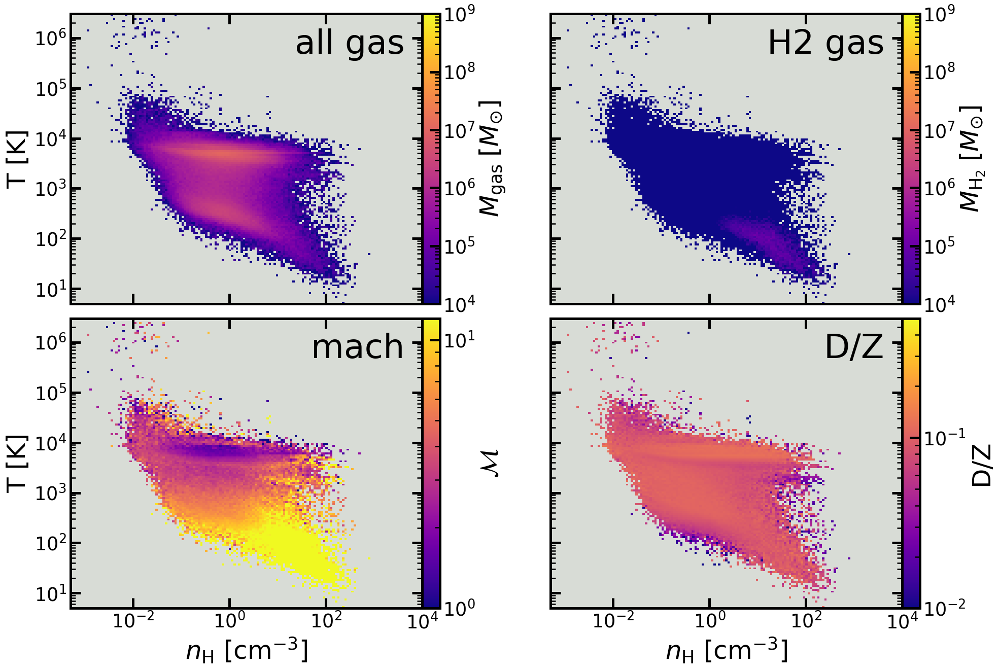

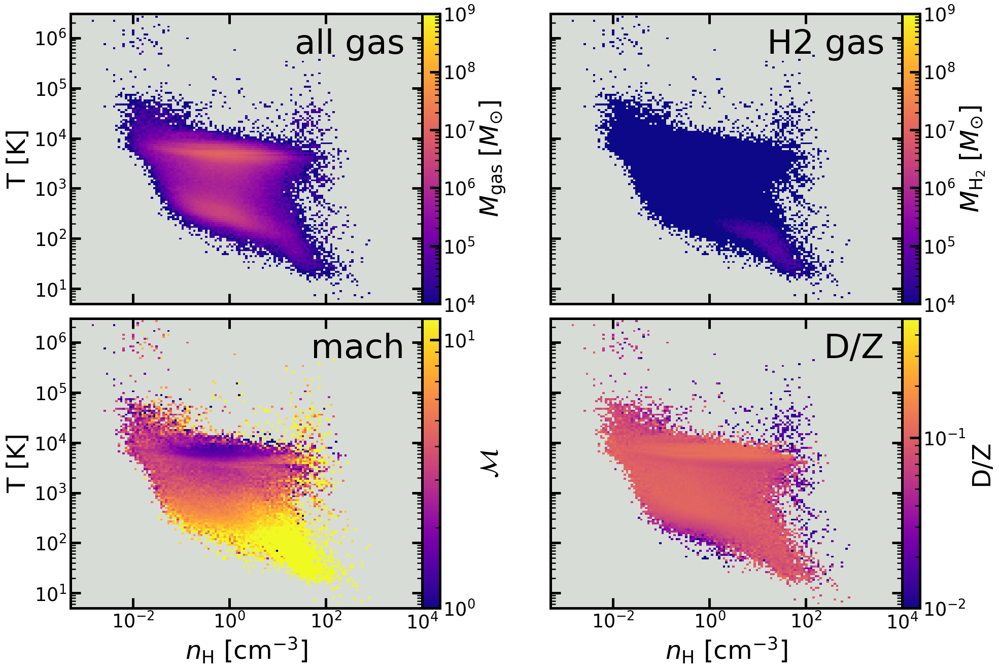

In [59]:
foutname = 'phase_diagram.pdf'
props = ['M_gas','M_H2','mach_number','D/Z']
fig_labels = ['all gas','H2 gas','mach','D/Z']
z_logs=[True]*len(props)
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-4,1E4]
T_lims = [5,3E6]

prop_lims=[[1E4,1E9],[1E4,1E9],[1,12],[0.01,0.5]]


for i,halo in enumerate(halos):
    sp=halo.sp
    print(sp.sdir)
    name = sim_names[i]

    fig = Figure(len(props),ncols=2, sharex='col',sharey='row')

    for j,prop in enumerate(props):
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        ret = calc.calc_phase_hist_data(prop, halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims)
        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[j],label=fig_labels[j])

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop=prop)

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)

#### Archeological Star Formation History

In [ ]:
foutname = 'SFH.pdf'


for i,sp in enumerate(snaps):
    print(sp.sdir)
    name = sim_names[i]

    time, cum_SFH = snap_utils.get_SFH(sp, cum=1)

    stars = sp.loadpart(4)
    sft, m = stars.get_property('sft'), stars.get_property('M_form')
    time, sfr = math_utils.SFH(sft, m, sp, dt=0.005, cum=False)

    fig = Figure(2,ncols=2)

    time_lims = [0,sp.time]

    fig.set_axis(0, 'time', 'sfr', x_lim=time_lims,x_log=False,twin_time_axis=False)
    fig.set_axis(1, 'time', 'M_star', x_lim=time_lims,x_log=False,twin_time_axis=False)


    fig.plot_line_data(0,time,sfr)

    fig.plot_line_data(1,time,cum_SFH)


    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)


#### D/Z and Mach Number Trends with Gas Density and Temperature

/N/project/choban_group/cchoban/size_evo_suite/MW_CoagOnly_CDense250/output


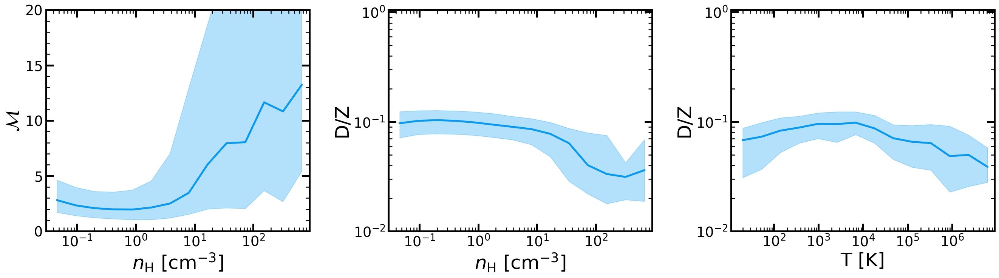

In [8]:


foutname = 'Mach_DZ.pdf'


for i,halo in enumerate(halos):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    fig = Figure(3,ncols=3)
    num_snaps = len(halos)
    colors = config.LINE_COLORS[:num_snaps]
    colors = config.LINE_COLORS[:num_snaps]
    linestyles = config.LINE_STYLES[:num_snaps]
    linewidth = 2*config.BASE_LINEWIDTH
    init_depl = 0

    # number of points per bin
    # Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
    points_per_bin=1

    fig.set_axis(0, 'nH', 'mach_number')
    fig.set_axis(1, 'nH', 'D/Z')
    fig.set_axis(2, 'T', 'D/Z')


    bin_nums=15

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property('mach_number','nH',halo, bin_nums=bin_nums)
    fig.plot_line_data(0,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(0,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property('D/Z','nH',halo, bin_nums=bin_nums)
    fig.plot_line_data(1,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(1,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property('D/Z','T',halo, bin_nums=bin_nums)
    fig.plot_line_data(2,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(2,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)


#### Grain size distributions for each ISM phase

##### Median distribution for each dust species

/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/fiducial/output
Snapshot time: 0.6500000000000004
Total dust mass sources: [      0.        0.  4579908.5       0. ]
ISM phase: all
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/10xVcoag/output
Snapshot time: 0.6500000000000004
Total dust mass sources: [      0.        0.  4566986.5       0. ]
ISM phase: all
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/no_Ccoag/output
Snapshot time: 0.6500000000000004
Total dust mass sources: [      0.        0.  4555669.5       0. ]
ISM phase: all
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/kolmogorov/output
Snapshot time: 0.6500000000000004
Total dust mass sources: [      0.       0. 4569799.       0.]
ISM phase: all
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/kol_10xVcoag/output
Snapshot time: 0.6500000000000004
Total dust mass sources: [      0.       0. 4578308.       0

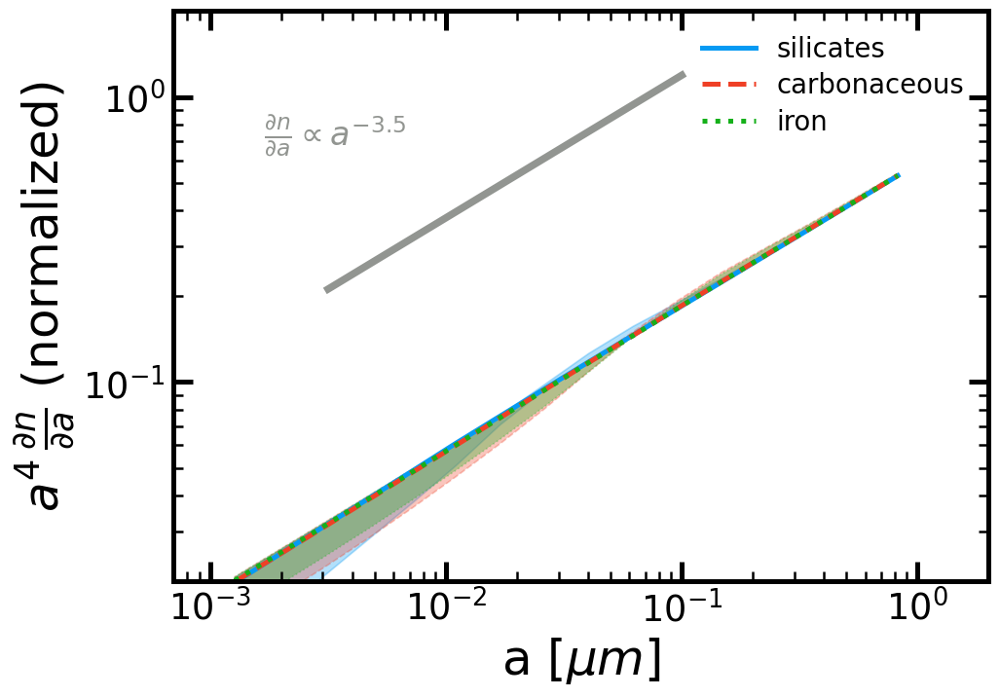

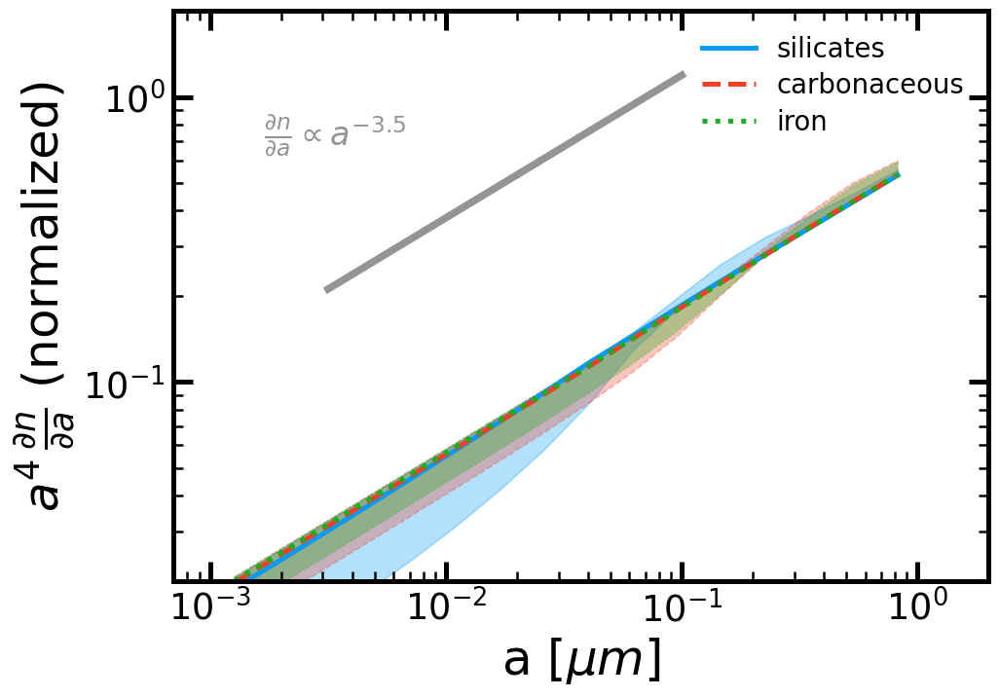

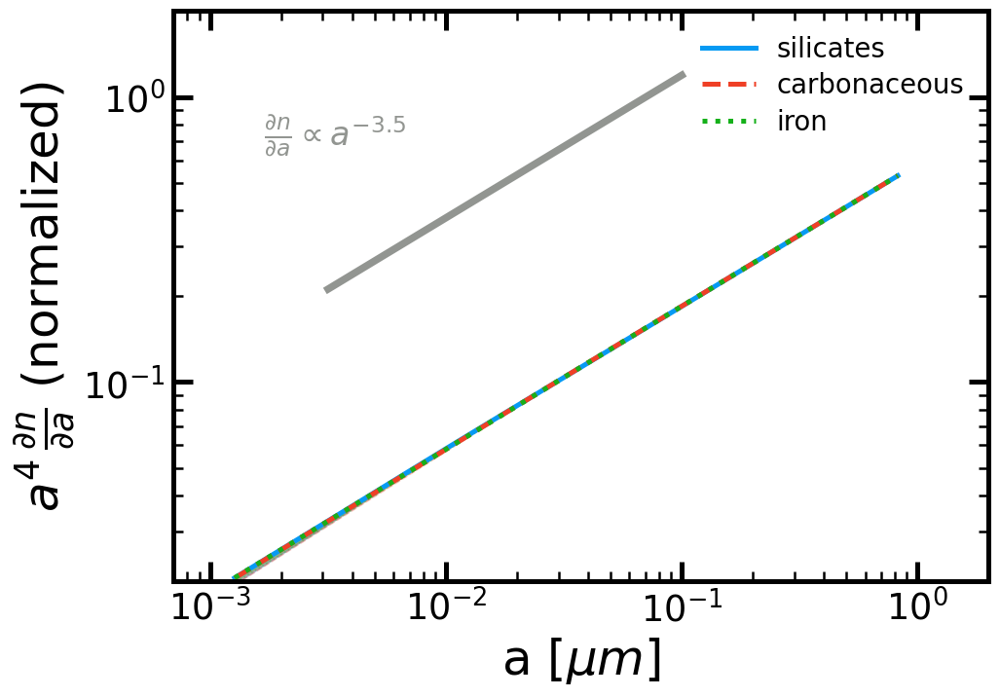

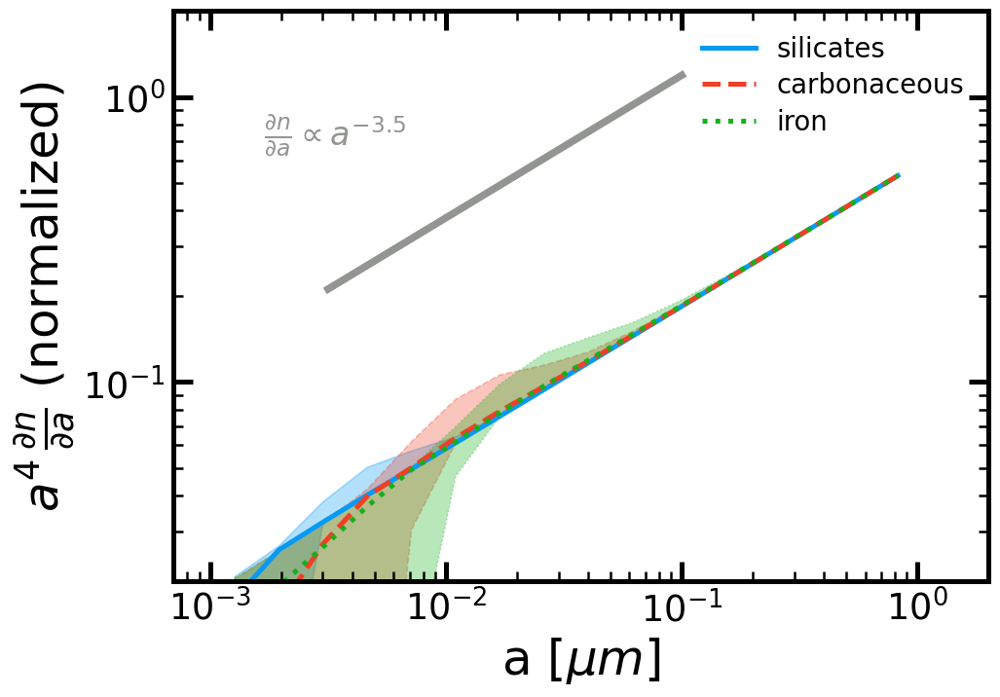

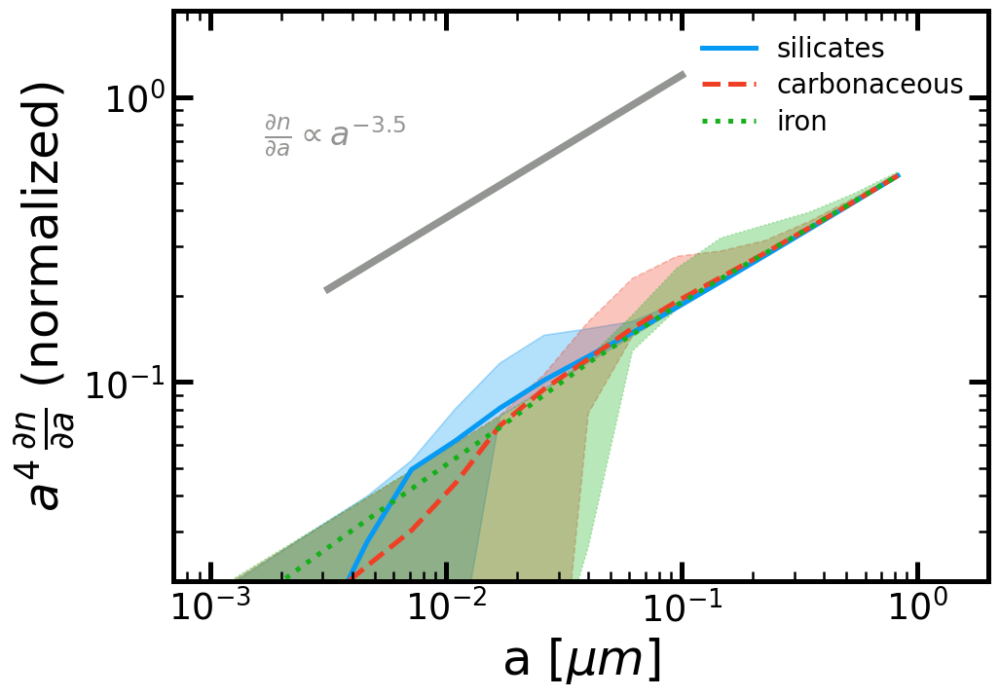

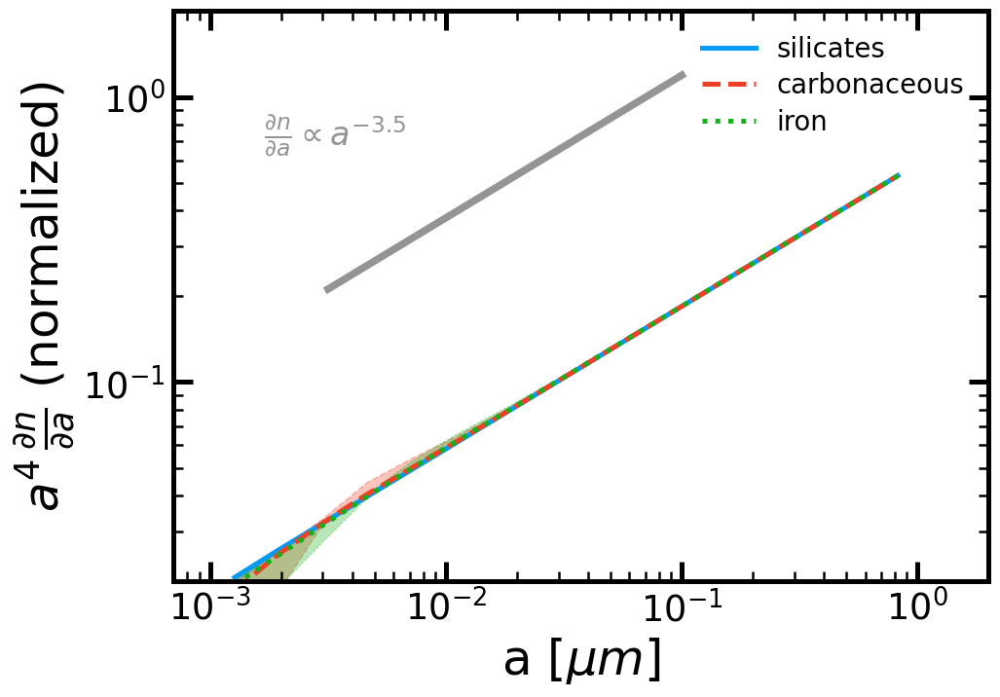

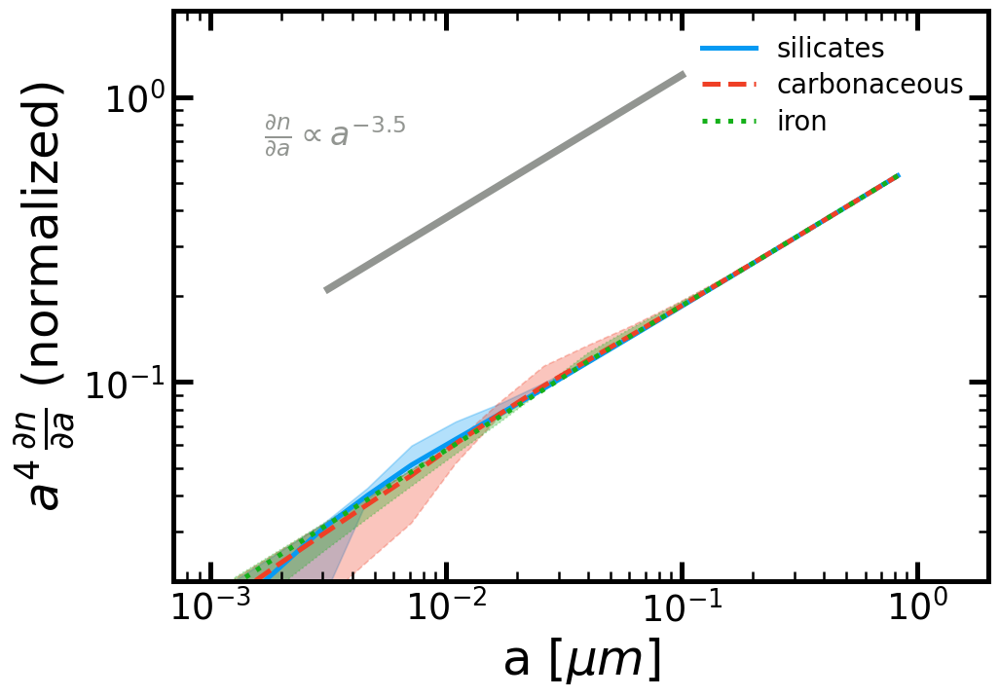

In [8]:

foutname = 'dmdloga_all_gas.pdf'


species=['silicates','carbonaceous','iron']
ISM_phases = ['all']



# number of points per bin
# Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
points_per_bin=1




for k,halo in enumerate(halos):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)

    fig = Figure(1)
    num_specs = len(species)
    num_phases = len(ISM_phases)
    colors = config.LINE_COLORS[:num_specs]
    linestyles = config.LINE_STYLES[:num_specs]
    linewidth = 2*config.BASE_LINEWIDTH
    fig.set_axis(0, 'grain_size', 'dm/dloga_norm',y_lim=[2E-2,2E-0])

    print("Snapshot time:",sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))

    for i,phase in enumerate(ISM_phases):
        if i==0:
            y_offset = 0.4
            MRN_a_vals = np.logspace(-2.5,-1,10)
            dmdloga_norm = quad(grain_size_utils.MRN_dmdloga, sp.Grain_Size_Min, sp.Grain_Size_Max)[0]
            dmdloga_vals = grain_size_utils.MRN_dmdloga(MRN_a_vals)/dmdloga_norm * np.power(10,y_offset)
            fig.plot_line_data(0,MRN_a_vals,dmdloga_vals, color='xkcd:grey',linestyle='-', linewidth=1.5*config.BASE_LINEWIDTH)
            x_coord = MRN_a_vals[len(MRN_a_vals)//4]
            y_coord = 1.1*dmdloga_vals[len(MRN_a_vals)//2]
            fig.add_text(0,x_coord,y_coord,r'$\frac{\partial n}{\partial a}\propto a^{-3.5}$',
                         ha='right', va='bottom',rescale_font=0.5, xycoords='data',color='xkcd:grey')
            for j, spec in enumerate(species):
                # Lines used for the legend handles. Should not show up in plot
                fig.plot_line_data(0,[-1,-1],[-1,-1], color='xkcd:black',linestyle=linestyles[j],label=spec)
        
        mask = calc.get_particle_mask(0, halo, mask_criteria=phase)
        print("ISM phase:",phase)

        for j, spec in enumerate(species):
            
            grain_size_vals, percentile_dnda, percentile_dmdloga = \
                grain_size_utils.get_grain_size_distribution(G, 
                                                             species=spec, 
                                                             mask=mask, 
                                                             points_per_bin=points_per_bin, 
                                                             std_percentiles = [16, 84])

            fig.plot_line_data(0,grain_size_vals,percentile_dmdloga[0], color=colors[j],linestyle=linestyles[j], label=spec)
            fig.plot_shaded_region(0,grain_size_vals,percentile_dmdloga[1],percentile_dmdloga[2], color=colors[j],linestyle=linestyles[j])

    fig.set_all_legends(max_cols=2,rescale_font=0.75)

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)

##### Median distribution for each gas phase

/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/fiducial/output
Snapshot time: 0.6500000000000004
Total dust mass sources: [      0.        0.  4579908.5       0. ]
ISM phase: cold
gas mass 0.0171277552 Msol
ISM phase: cool
gas mass 0.0125053624 Msol
ISM phase: warm
gas mass 0.2449805568 Msol
ISM phase: hot
gas mass 0.0040600048 Msol
ISM phase: coronal
gas mass 0.000165809375 Msol
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/10xVcoag/output
Snapshot time: 0.6500000000000004
Total dust mass sources: [      0.        0.  4566986.5       0. ]
ISM phase: cold
gas mass 0.0143730624 Msol
ISM phase: cool
gas mass 0.0105346496 Msol
ISM phase: warm
gas mass 0.2495383808 Msol
ISM phase: hot
gas mass 0.0038188148 Msol
ISM phase: coronal
gas mass 0.00010021088125 Msol
/N/project/choban_group/cchoban/size_evo_suite/Frontera/coag_only_tests/no_Ccoag/output
Snapshot time: 0.6500000000000004
Total dust mass sources: [      0.        0.  4555669.5     

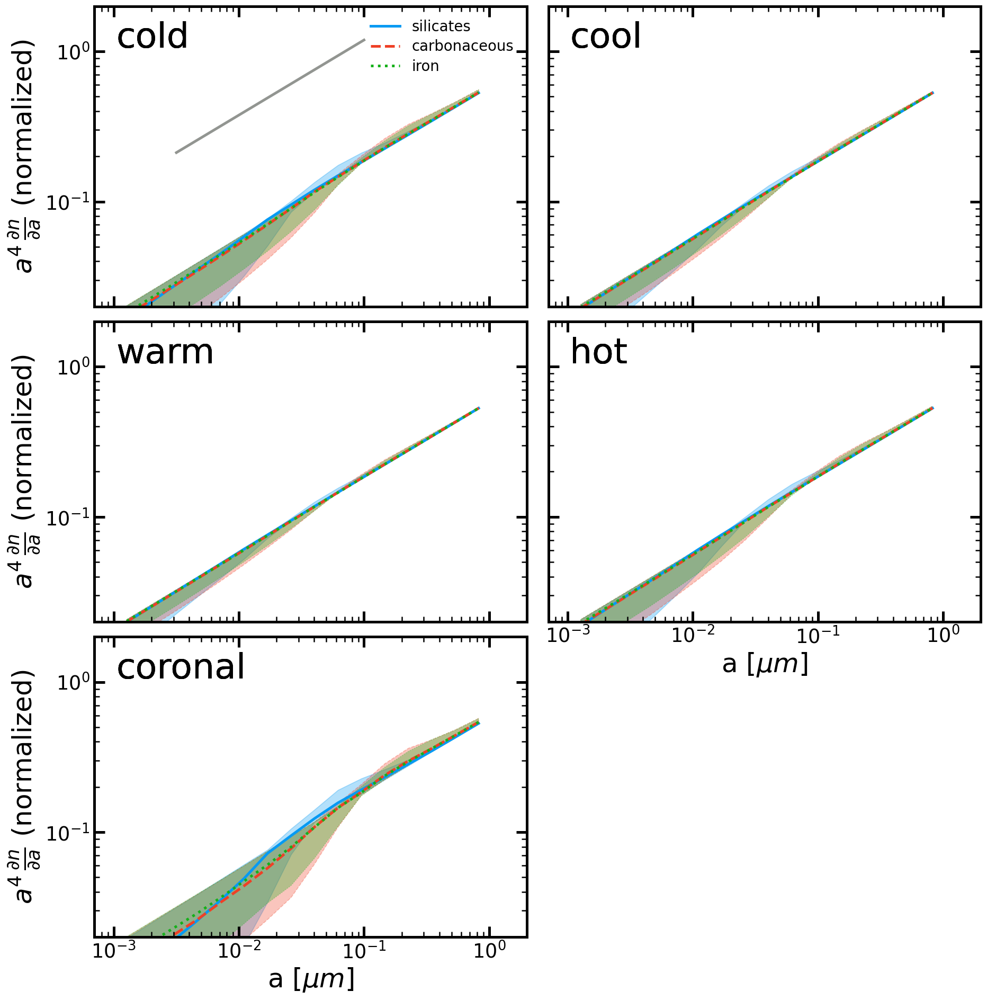

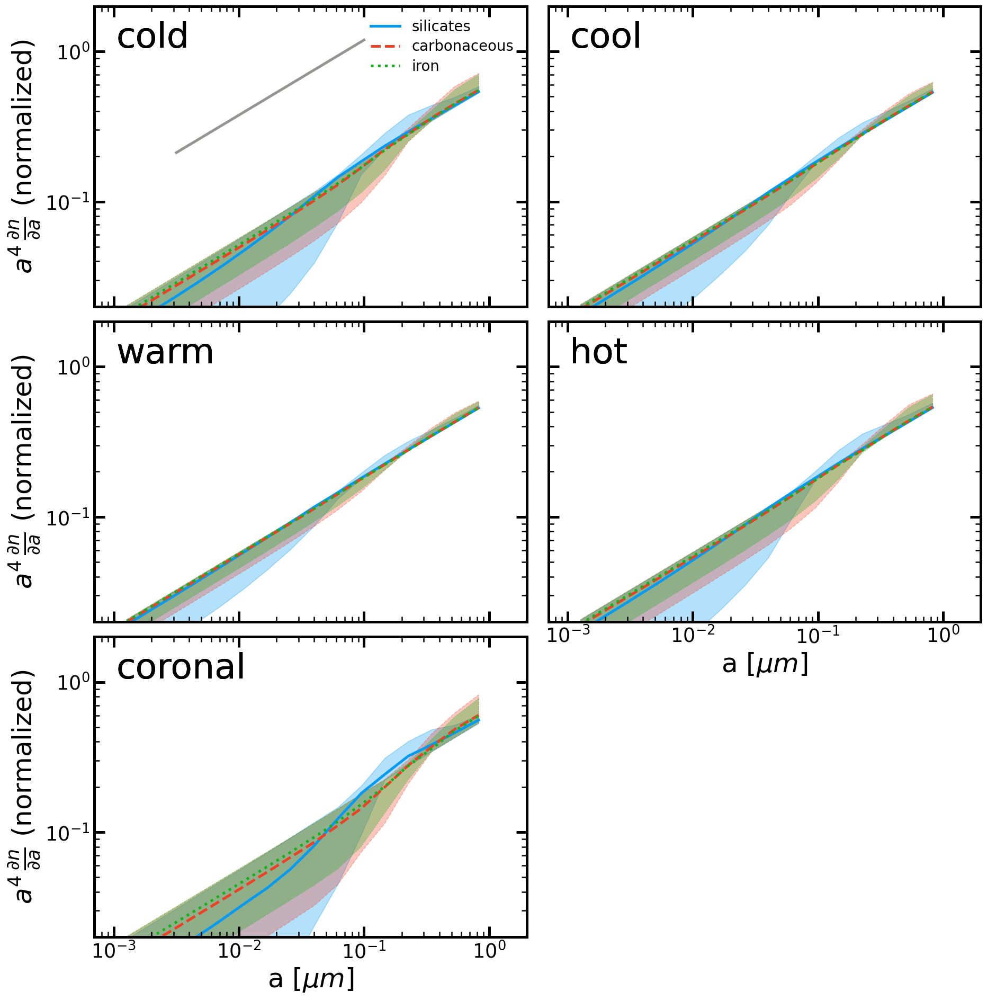

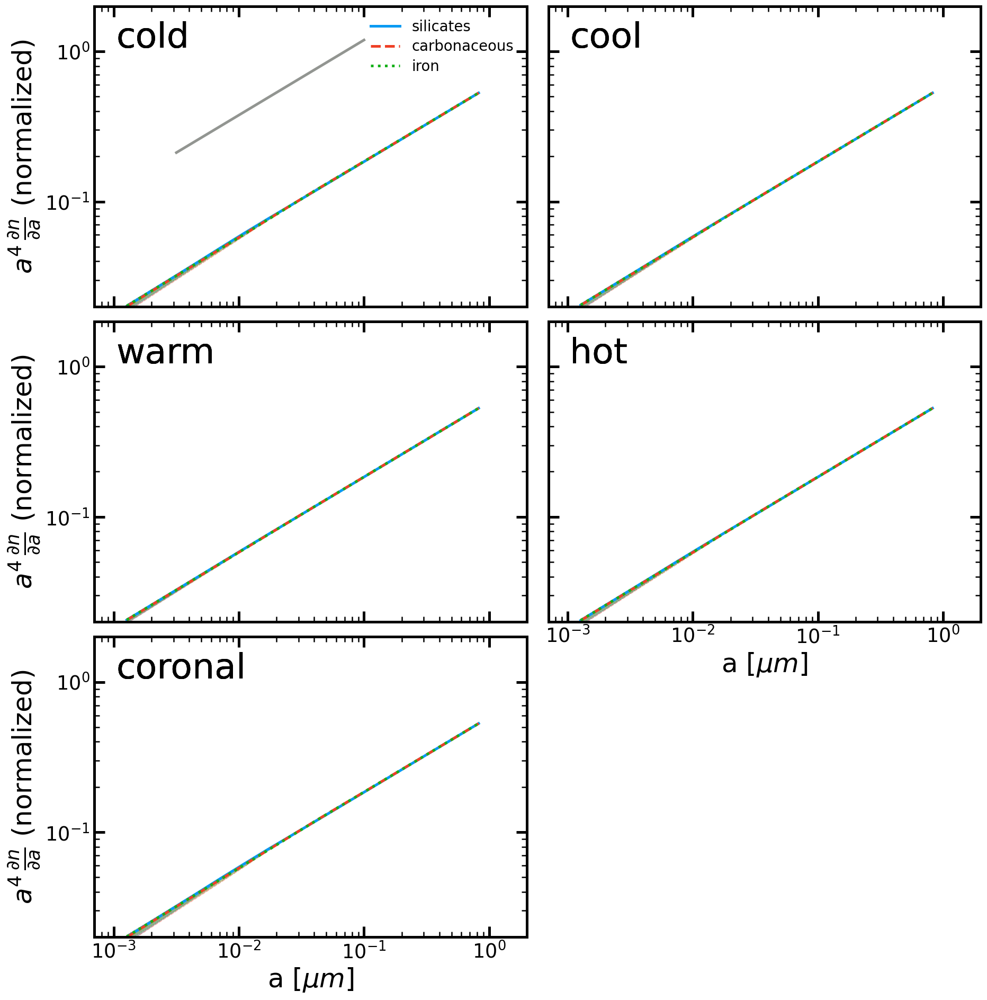

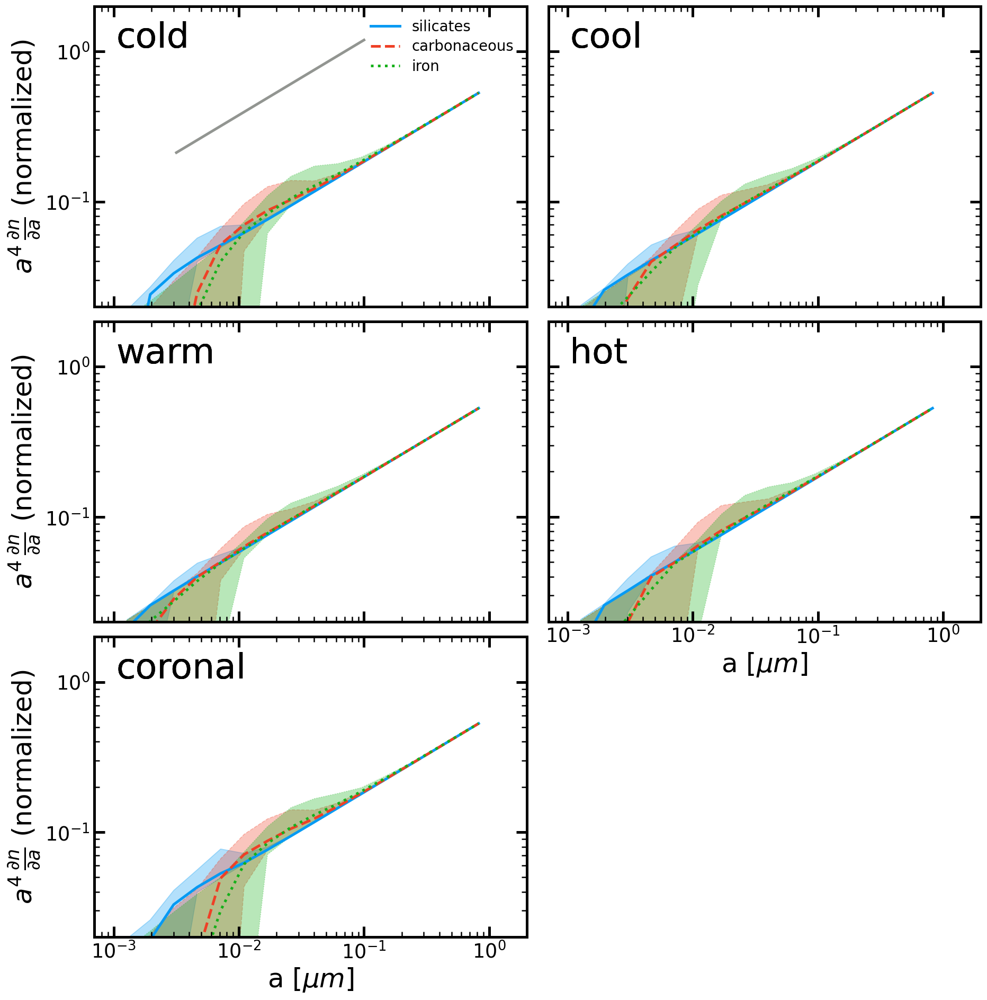

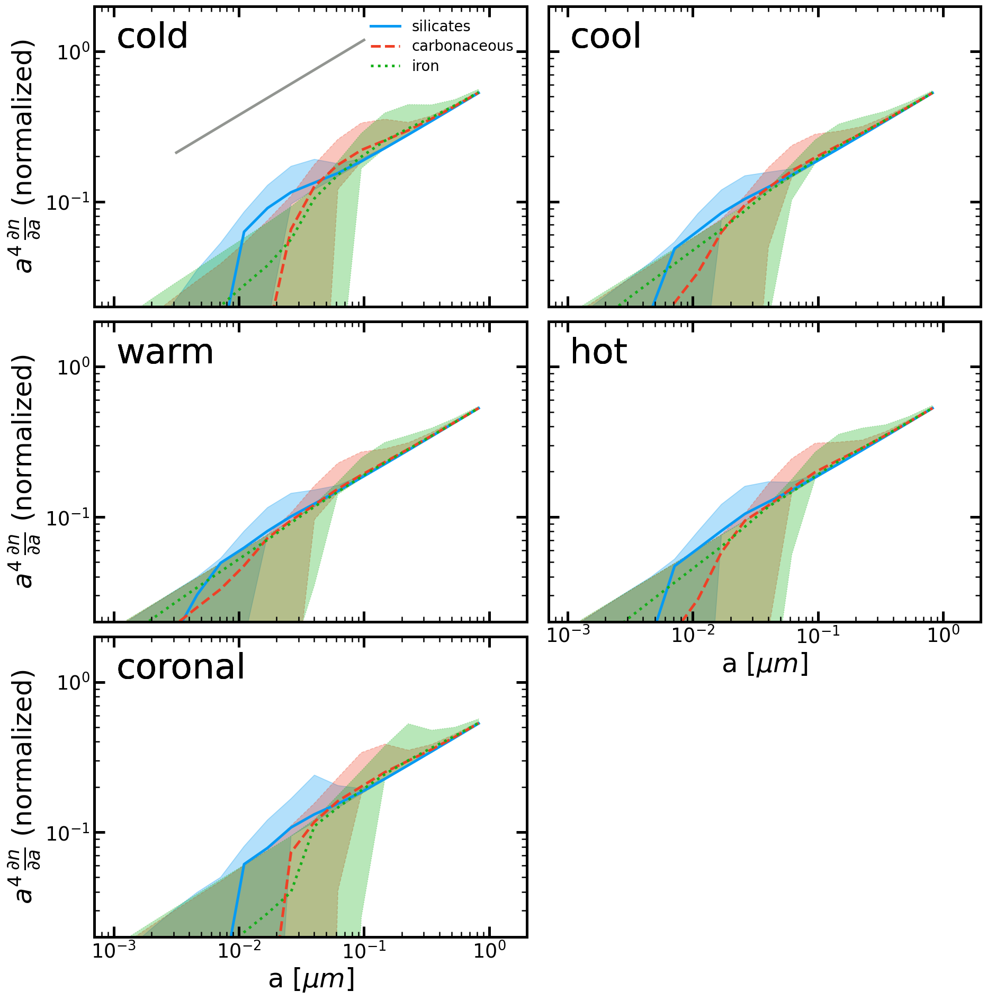

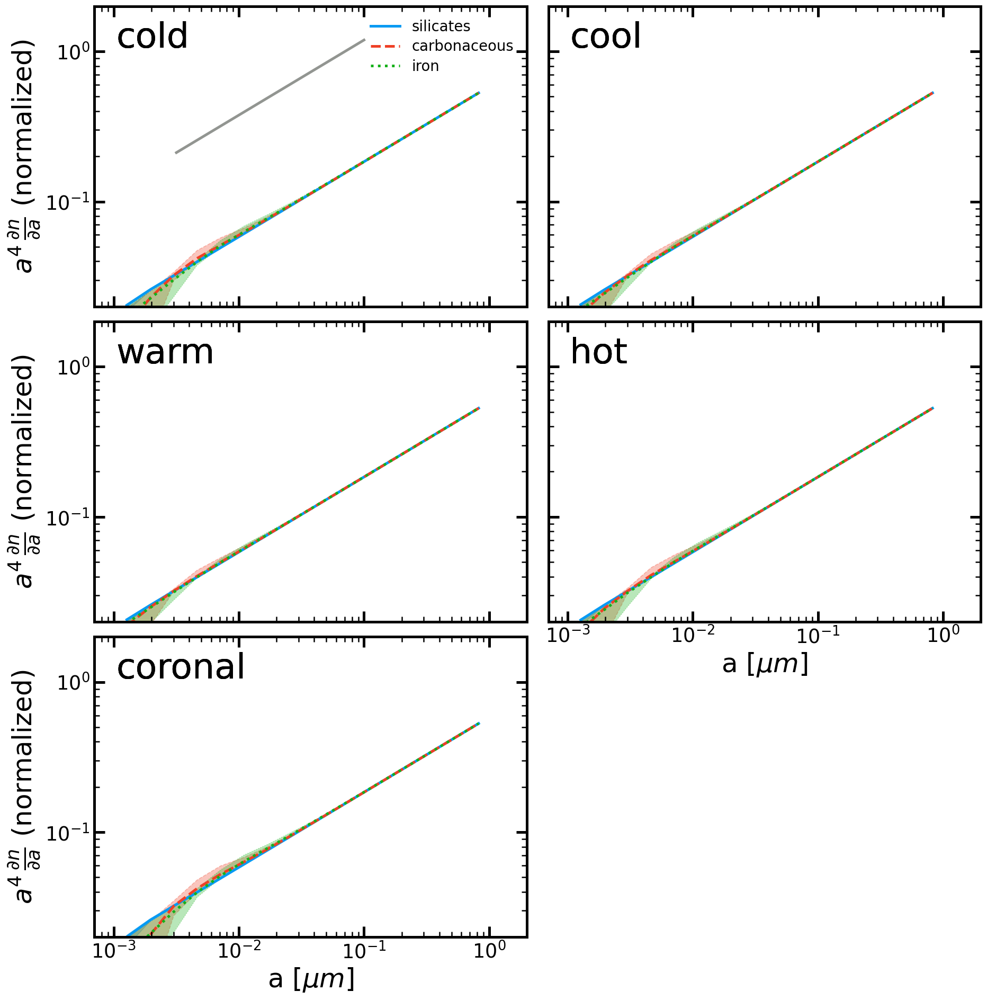

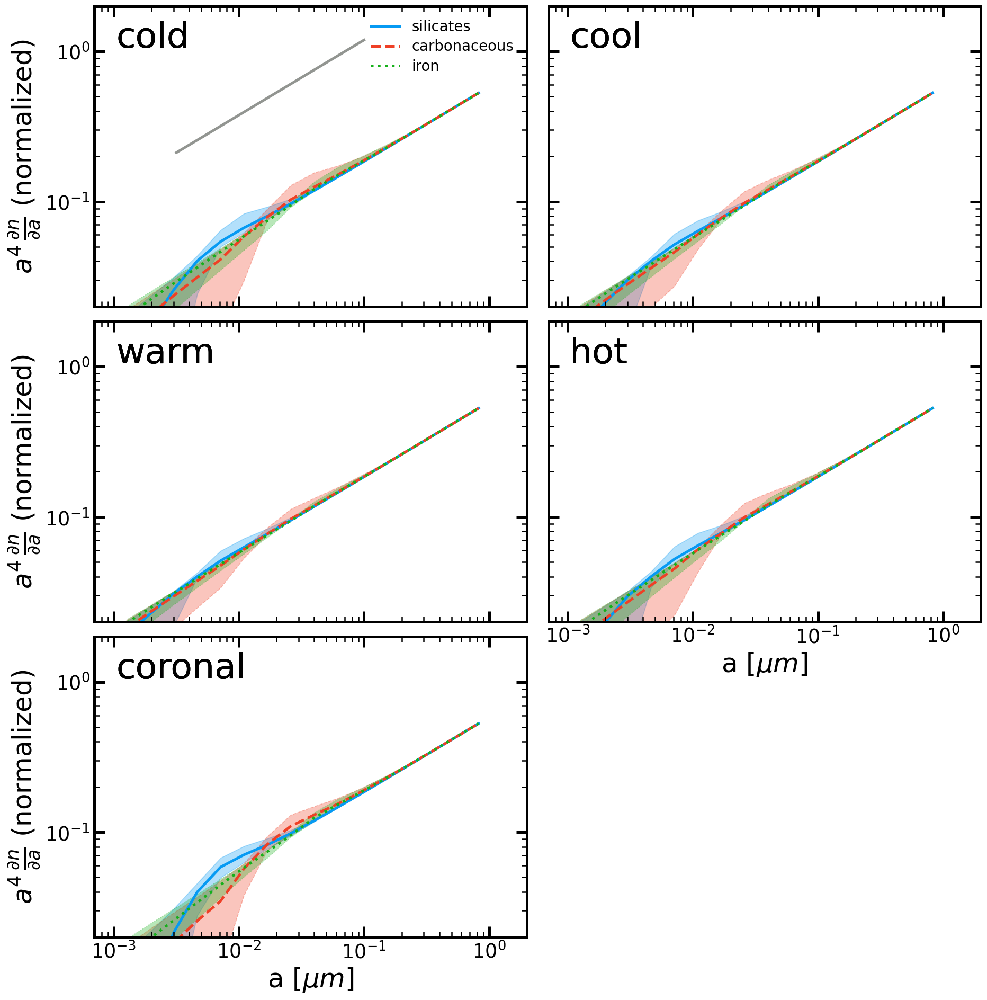

In [9]:

foutname = 'grain_dmdloga_ISM_phases.pdf'


species=['silicates','carbonaceous','iron']
ISM_phases = ['cold','cool','warm','hot','coronal']


# number of points per bin
# Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
points_per_bin=1




for k,halo in enumerate(halos):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)
    num_specs = len(species)
    num_phases = len(ISM_phases)


    fig = Figure(num_phases,ncols=2, sharex='col',sharey='row')

    colors = config.LINE_COLORS[:num_specs]
    linestyles = config.LINE_STYLES[:num_specs]
    linewidth = 2*config.BASE_LINEWIDTH

    print("Snapshot time:",sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))


    for i,phase in enumerate(ISM_phases):
        mask = calc.get_particle_mask(0, halo, mask_criteria=phase)
        print("ISM phase:",phase)
        print('gas mass', np.sum(G.get_property('mass')[mask])/1E10,'Msol')

        fig.set_axis(i, 'grain_size', 'dm/dloga_norm',y_lim=[2E-2,2E-0])

        if i==0:
            y_offset = 0.4
            dmdloga_norm = quad(grain_size_utils.MRN_dmdloga, sp.Grain_Size_Min, sp.Grain_Size_Max)[0]
            dmdloga_vals = grain_size_utils.MRN_dmdloga(MRN_a_vals)/dmdloga_norm * np.power(10,y_offset)
            fig.plot_line_data(i,MRN_a_vals,dmdloga_vals, color='xkcd:grey',linestyle='-')
            for j, spec in enumerate(species):
                # Lines used for the legend handles. Should not show up in plot
                fig.plot_line_data(0,[-1,-1],[-1,-1], color='xkcd:black',linestyle=linestyles[j],label=spec)
        
 
        for j, spec in enumerate(species):
            
            grain_size_vals, percentile_dnda, percentile_dmdloga = \
                grain_size_utils.get_grain_size_distribution(G, 
                                                             species=spec, 
                                                             mask=mask, 
                                                             points_per_bin=points_per_bin, 
                                                             std_percentiles = [16, 84])


            fig.plot_line_data(i,grain_size_vals,percentile_dmdloga[0], color=colors[j],linestyle=linestyles[j], label=spec)
            fig.plot_shaded_region(i,grain_size_vals,percentile_dmdloga[1],percentile_dmdloga[2], color=colors[j],linestyle=linestyles[j])
            fig.add_text(i,0.05,0.95,phase,ha='left', va='top',)

    fig.set_all_legends(max_cols=2,rescale_font=0.75)

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)

##### Shattering and Coagulation Mass Rate

/N/project/choban_group/cchoban/size_evo_suite/MW_ShatCoag_Only/output
/N/project/choban_group/cchoban/size_evo_suite//MW_Kolmogorov_ShatCoag/output


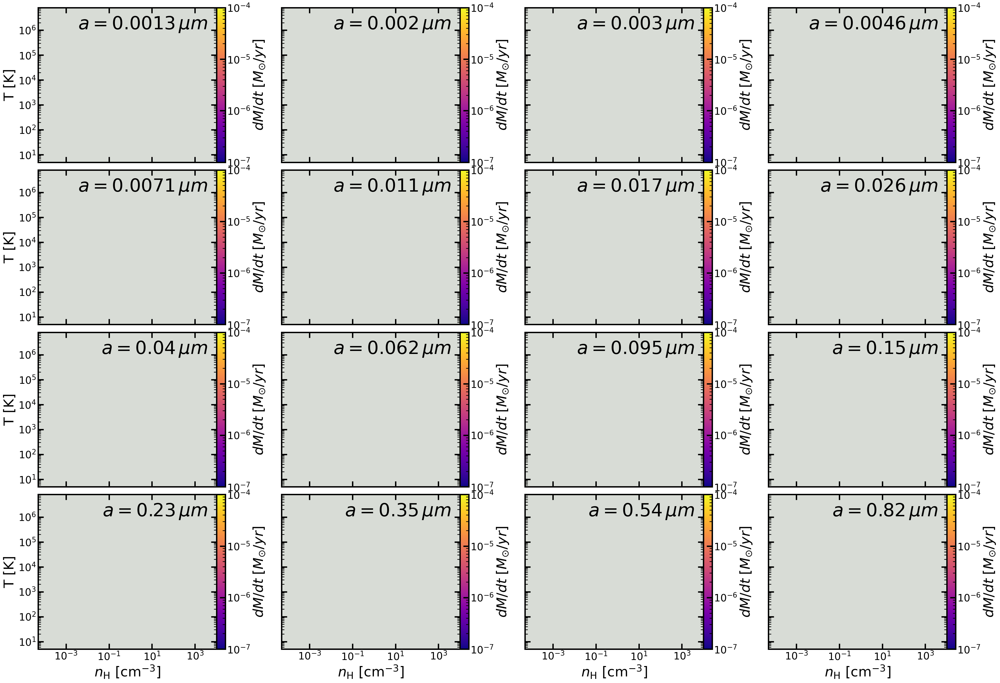

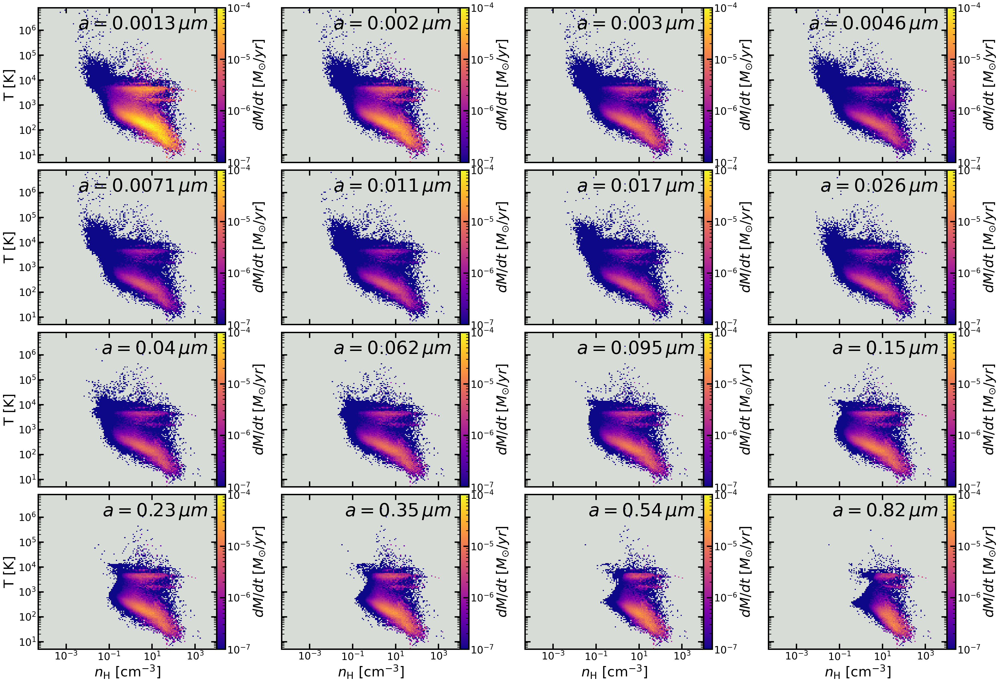

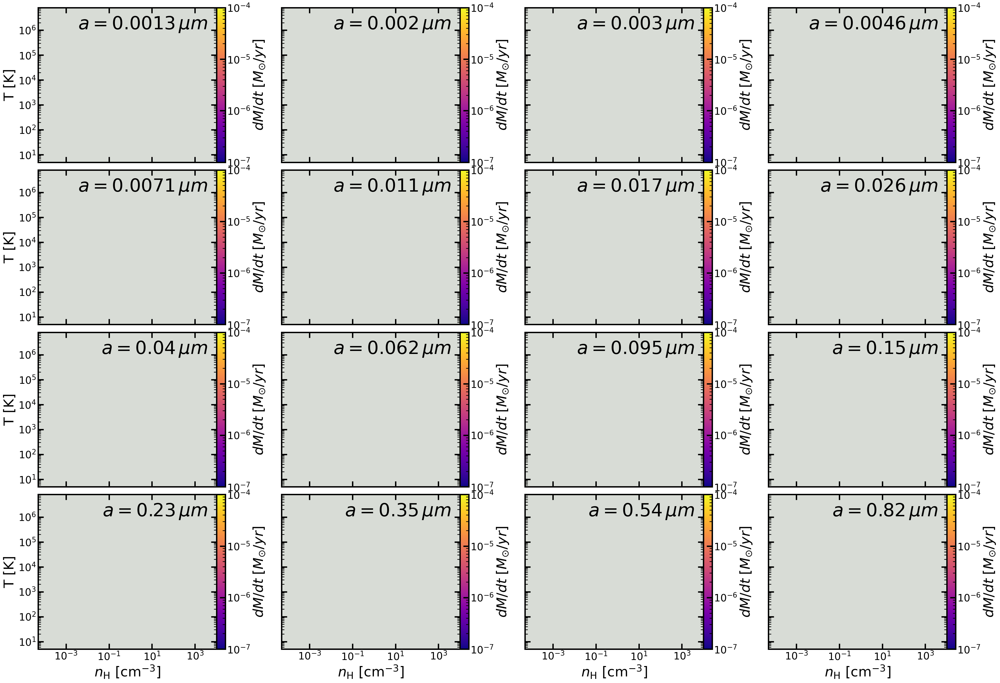

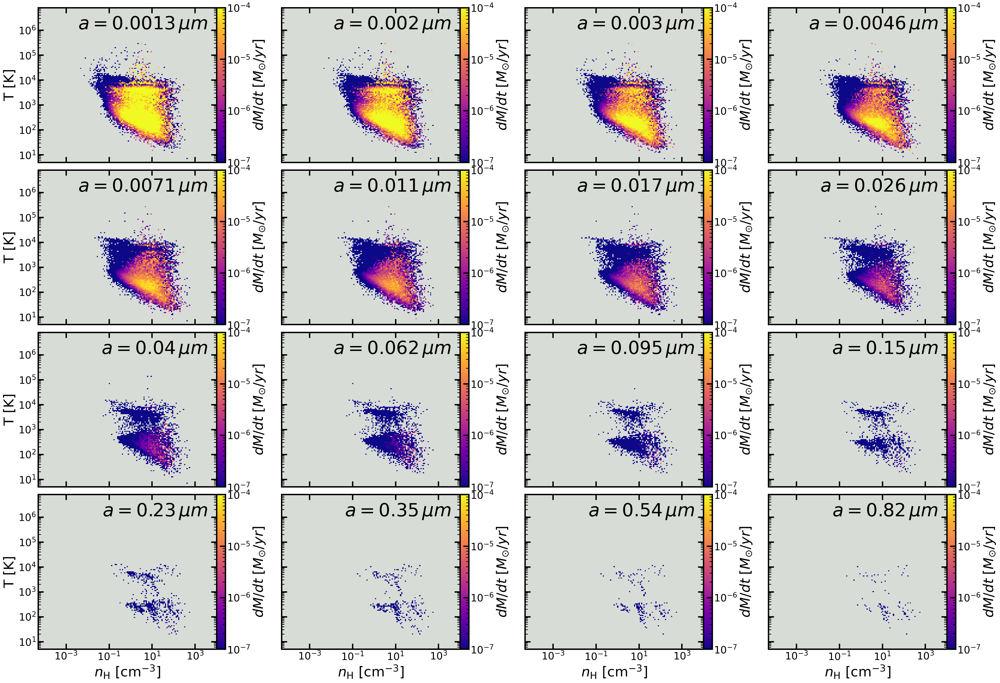

In [66]:

props = ['dMdt_coag','dMdt_shat']
fig_labels = ['coagulation','shattering']
spec_ind = 0
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


coag_lim=[1E-7,1E-4]
shat_lim=[1E-10,1E-7]


for i,halo in enumerate(halos):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    grain_bins = halo.sp.Flag_GrainSizeBins
    a_centers = halo.sp.Grain_Bin_Centers

    G = halo.loadpart(0)





    foutname = 'coag_pos_dMdt_phase_diagram.pdf'
    fig = Figure(grain_bins,ncols=4, sharex='col',sharey='row')
    coag_rate = G.get_property('grain_coag_rate')
    for j in range(grain_bins):
        a_center = a_centers[j]
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

        coag_rate[coag_rate<0] = 0

        ret = calc.calc_phase_hist_data(coag_rate[:,spec_ind,j], halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, 'dMdt', X, Y, ret.statistic.T, cmap=cmap, z_lim=coag_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%a_center)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='dMdt')

    
    fig.save(plot_dir+name+'_'+str(snap_num)+'_'+foutname)



    foutname = 'coag_neg_dMdt_phase_diagram.pdf'
    fig = Figure(grain_bins,ncols=4, sharex='col',sharey='row')
    coag_rate = G.get_property('grain_coag_rate')
    for j in range(grain_bins):
        a_center = a_centers[j]
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

        coag_rate[coag_rate>0] = 0
        ret = calc.calc_phase_hist_data(-coag_rate[:,spec_ind,j], halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, 'dMdt', X, Y, ret.statistic.T, cmap=cmap, z_lim=coag_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%a_center)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='dMdt')

    
    fig.save(plot_dir+name+'_'+str(snap_num)+'_'+foutname)


/N/project/choban_group/cchoban/size_evo_suite/MW_ShatCoag_Only/output
/N/project/choban_group/cchoban/size_evo_suite//MW_Kolmogorov_ShatCoag/output


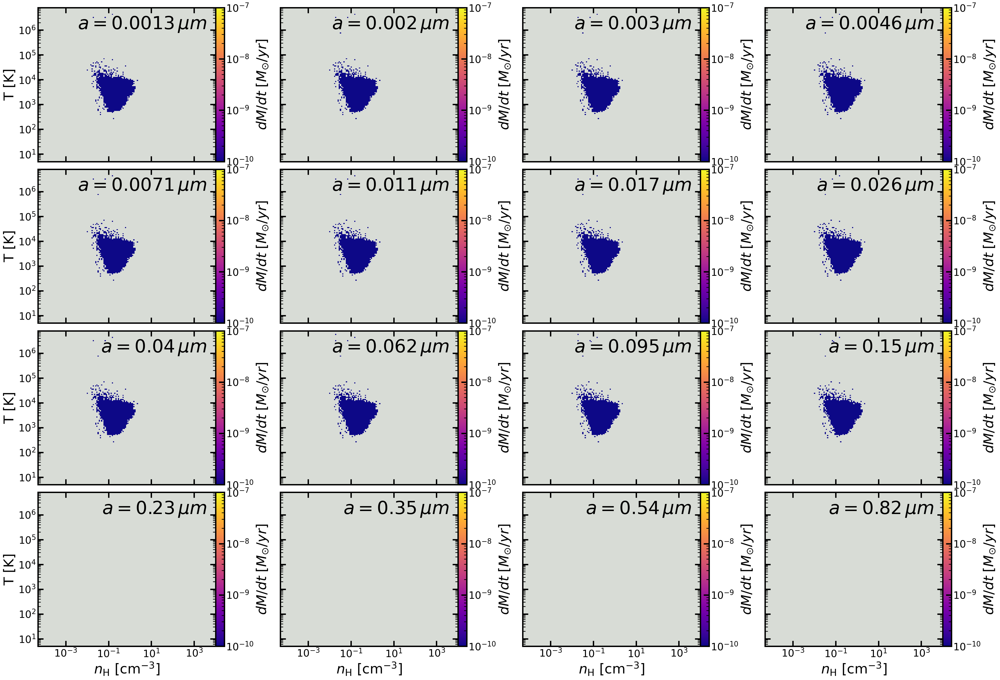

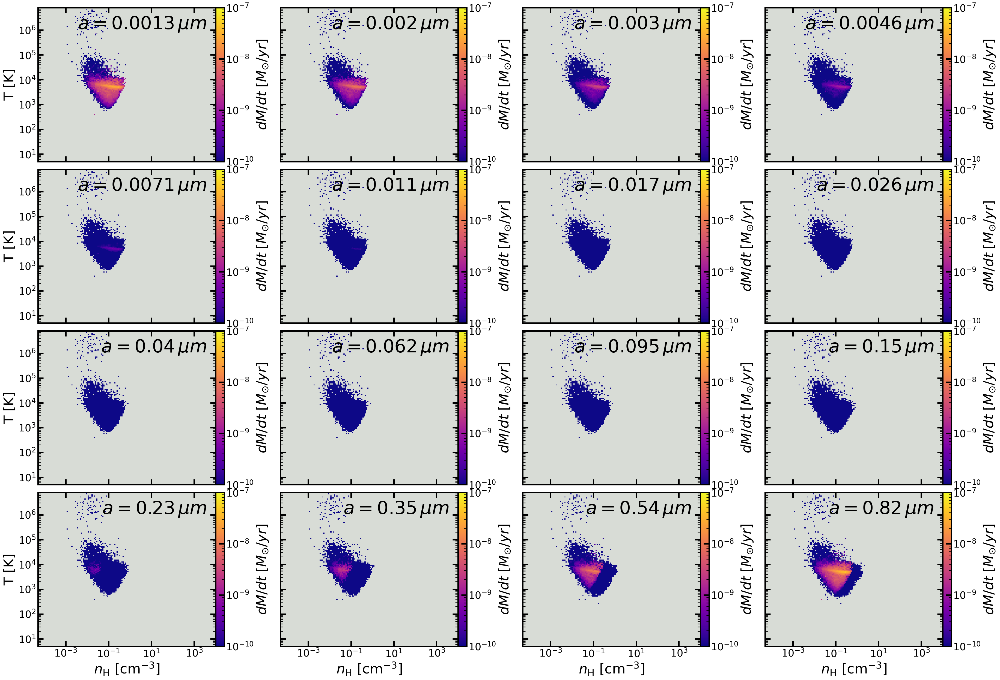

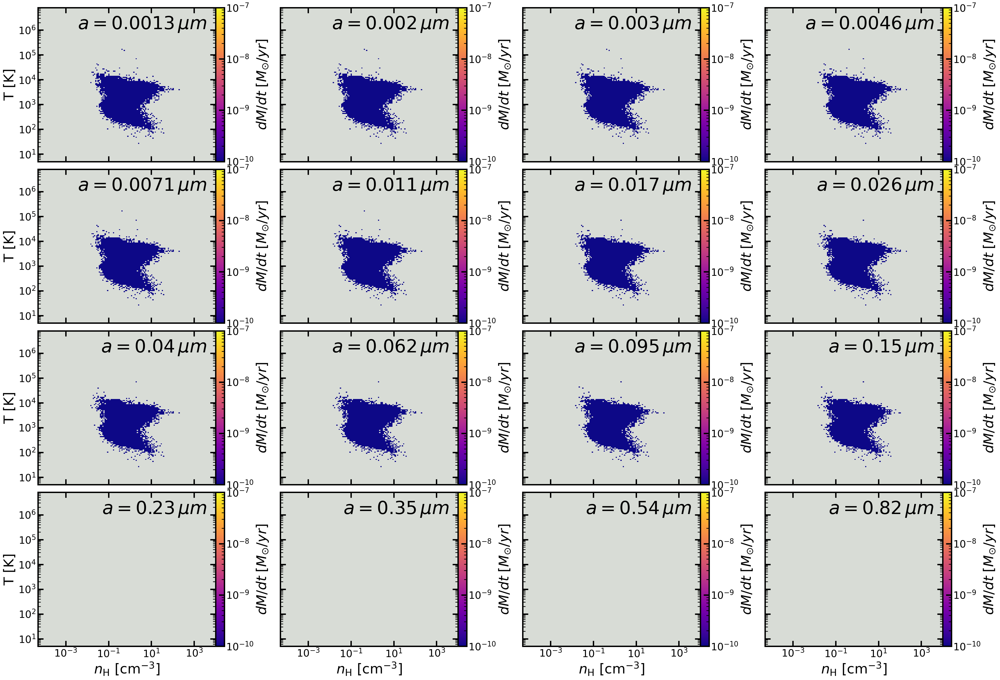

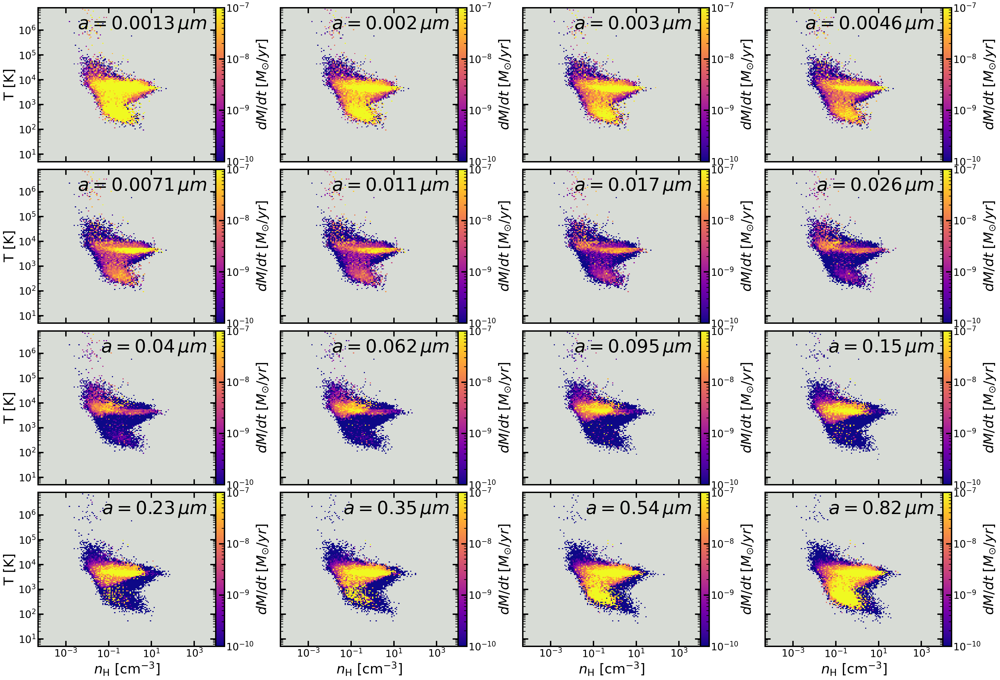

In [62]:

props = ['dMdt_coag','dMdt_shat']
fig_labels = ['coagulation','shattering']
spec_ind = 0
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


coag_lim=[1E-7,1E-4]
shat_lim=[1E-10,1E-7]


for i,halo in enumerate(halos):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    grain_bins = halo.sp.Flag_GrainSizeBins
    a_centers = halo.sp.Grain_Bin_Centers

    G = halo.loadpart(0)


    foutname = 'shat_pos_dMdt_phase_diagram.pdf'
    fig = Figure(grain_bins,ncols=4, sharex='col',sharey='row')
    shat_rate = G.get_property('grain_shat_rate')
    for j in range(grain_bins):
        a_center = a_centers[j]
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

        shat_rate[shat_rate<0] = 0
        ret = calc.calc_phase_hist_data(shat_rate[:,spec_ind,j], halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, 'dMdt', X, Y, ret.statistic.T, cmap=cmap, z_lim=shat_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%a_center)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='dMdt')

    fig.save(plot_dir+name+'_'+str(snap_num)+'_'+foutname)

    foutname = 'shat_neg_dMdt_phase_diagram.pdf'
    fig = Figure(grain_bins,ncols=4, sharex='col',sharey='row')
    shat_rate = G.get_property('grain_shat_rate')
    for j in range(grain_bins):
        a_center = a_centers[j]
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

        shat_rate[shat_rate>0] = 0
        ret = calc.calc_phase_hist_data(-shat_rate[:,spec_ind,j], halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, 'dMdt', X, Y, ret.statistic.T, cmap=cmap, z_lim=shat_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%a_center)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='dMdt')

    fig.save(plot_dir+name+'_'+str(snap_num)+'_'+foutname)
